**PROYECTO DE APLICACION DE MACHINE LEARNING PARA LA CLASIFICACION DE GENEROS MUSICALES**

En Spotify, las canciones están asociadas a un conjunto de variables y características que capturan diferentes aspectos de la composición musical. La utilización eficiente de estas características, junto a la utilización de diversos modelos, nos llevará a una clasificación más óptima.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import math
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder, RobustScaler, StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
!pip install lazypredict
import lazypredict
from lazypredict.Supervised import LazyClassifier
import plotly.graph_objects as go
from sklearn.inspection import permutation_importance
from plotnine import *



A continuación vamos a trabajar con un dataset de Spotify, que entrenaremos y nos servirá para aplicar más adelante, el mejor modelo de clasificación de géneros obtenido a un dataset del que predeciremos/clasificaremos los géneros de más de 1.200.000 canciones.

In [ ]:
#https://www.kaggle.com/datasets/laurabarreda/spotify-tracks-by-genre-8-genres-classification
df_spotify = pd.read_csv('spotify_all_genres_tracks.csv')
df_spotify

,track_id,playlist_url,playlist_name,track_name,track_popularity,artist_name,album,album_cover,artist_genres,artist_popularity,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,4Gia17DzXBhYFbYiJj6SyW,https://open.spotify.com/playlist/7qACZGMjyo64...,The Sound of Blues,Working Man,51,Otis Rush,Mourning In The Morning,https://i.scdn.co/image/ab67616d0000b273fea221...,"['blues', 'blues rock', 'chicago blues', 'elec...",41,...,1,0.04,0.49,0.00,0.20,0.84,103.36,147800,4,blues
1,1BjYNhg7JhVfQdxqEThBwn,https://open.spotify.com/playlist/7qACZGMjyo64...,The Sound of Blues,Long Way Home,38,"Clarence ""Gatemouth"" Brown",Long Way Home,https://i.scdn.co/image/ab67616d0000b2730e1f13...,"['blues', 'blues rock', 'memphis blues', 'mode...",33,...,0,0.04,0.91,0.05,0.12,0.42,78.03,338333,4,blues
2,2Cg3GUkhjX96nO4p2WRlIa,https://open.spotify.com/playlist/7qACZGMjyo64...,The Sound of Blues,She's A Sweet One,49,Junior Wells,"Calling All Blues - The Chief, Profile & USA R...",https://i.scdn.co/image/ab67616d0000b27399b18c...,"['blues', 'blues rock', 'chicago blues', 'elec...",41,...,1,0.05,0.15,0.03,0.20,0.71,122.86,181786,4,blues
3,5bC6ONDsL88snGN6QasjZH,https://open.spotify.com/playlist/7qACZGMjyo64...,The Sound of Blues,Help Me,59,Sonny Boy Williamson II,More Real Folk Blues,https://i.scdn.co/image/ab67616d0000b273b48c81...,"['acoustic blues', 'blues', 'blues rock', 'chi...",46,...,0,0.04,0.60,0.02,0.61,0.77,114.22,188200,4,blues
4,2TKykeHeVKsBqZC8M3SKcN,https://open.spotify.com/playlist/7qACZGMjyo64...,The Sound of Blues,Take Out Some Insurance,51,Jimmy Reed,Rockin' With Reed,https://i.scdn.co/image/ab67616d0000b2739b7573...,"['blues', 'blues rock', 'chicago blues', 'elec...",42,...,1,0.05,0.66,0.00,0.12,0.57,111.33,143332,4,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9193,2oGYxgu2ztDaf64of4edww,https://open.spotify.com/playlist/50kZecUV5pY2...,The Sound of Techno,Walking with Clouds,17,Transllusion,The Opening of the Cerebral Gate,https://i.scdn.co/image/ab67616d0000b2730c430e...,"['electro', 'techno']",14,...,1,0.05,0.00,0.76,0.11,0.23,135.34,212160,4,electronic
9194,2TbbgHiwZVjErsxkTm63Lh,https://open.spotify.com/playlist/50kZecUV5pY2...,The Sound of Techno,Start To Move,23,Oscar Mulero,Mannequin,https://i.scdn.co/image/ab67616d0000b273abfdcb...,"['minimal dub', 'minimal techno', 'spanish tec...",27,...,1,0.11,0.01,0.94,0.12,0.42,133.99,317483,3,electronic
9195,0Rwl08UX8lNW6Cn8eb068P,https://open.spotify.com/playlist/50kZecUV5pY2...,The Sound of Techno,Take Me Away - Truncate Remix,7,DJ 3000,Take Me Away,https://i.scdn.co/image/ab67616d0000b273371dce...,"['detroit techno', 'techno']",7,...,0,0.05,0.00,0.94,0.12,0.18,130.01,355586,4,electronic
9196,1M33B7EKfhIx3xtEYjnoKz,https://open.spotify.com/playlist/50kZecUV5pY2...,The Sound of Techno,Funny,24,Mr. De',Follow the Leader 4,https://i.scdn.co/image/ab67616d0000b273ba561d...,"['electro', 'ghettotech', 'techno']",27,...,0,0.07,0.03,0.86,0.11,0.69,148.00,236333,4,electronic


Visualiizamos las columnas del dataset:

In [ ]:
df_spotify.dtypes

track_id              object
playlist_url          object
playlist_name         object
track_name            object
track_popularity       int64
artist_name           object
album                 object
album_cover           object
artist_genres         object
artist_popularity      int64
danceability         float64
energy               float64
key                    int64
loudness             float64
mode                   int64
speechiness          float64
acousticness         float64
instrumentalness     float64
liveness             float64
valence              float64
tempo                float64
duration_ms            int64
time_signature         int64
genre                 object
dtype: object

In [ ]:
df_spotify.columns

Index(['track_id', 'playlist_url', 'playlist_name', 'track_name',
       'track_popularity', 'artist_name', 'album', 'album_cover',
       'artist_genres', 'artist_popularity', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature',
       'genre'],
      dtype='object')

Eliminamos las columnas que no vamos a necesitar. De entre ellas, las variables'track popularity' y 'artist popularity' no son relevantes para determinar un género musical. Por otro lado, también eliminaremos 'artist genres'. Se trata de una columna que asigna múltiples subgéneros musicales a cada canción, pero que se agrupan a su vez en un género principal que es, en nuestro caso, la columna 'genre' que será nuestro target.

In [ ]:
df_spotify_cleaned = df_spotify.drop(['track_id', 'playlist_url', 'playlist_name','track_popularity',
                                   'album_cover','artist_genres','artist_popularity'], axis=1)
df_spotify_cleaned

,track_name,artist_name,album,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,Working Man,Otis Rush,Mourning In The Morning,0.63,0.62,0,-10.95,1,0.04,0.49,0.00,0.20,0.84,103.36,147800,4,blues
1,Long Way Home,"Clarence ""Gatemouth"" Brown",Long Way Home,0.73,0.05,11,-22.56,0,0.04,0.91,0.05,0.12,0.42,78.03,338333,4,blues
2,She's A Sweet One,Junior Wells,"Calling All Blues - The Chief, Profile & USA R...",0.70,0.48,1,-12.21,1,0.05,0.15,0.03,0.20,0.71,122.86,181786,4,blues
3,Help Me,Sonny Boy Williamson II,More Real Folk Blues,0.74,0.44,5,-9.62,0,0.04,0.60,0.02,0.61,0.77,114.22,188200,4,blues
4,Take Out Some Insurance,Jimmy Reed,Rockin' With Reed,0.75,0.29,9,-14.44,1,0.05,0.66,0.00,0.12,0.57,111.33,143332,4,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9193,Walking with Clouds,Transllusion,The Opening of the Cerebral Gate,0.78,0.64,1,-9.45,1,0.05,0.00,0.76,0.11,0.23,135.34,212160,4,electronic
9194,Start To Move,Oscar Mulero,Mannequin,0.72,0.83,1,-9.15,1,0.11,0.01,0.94,0.12,0.42,133.99,317483,3,electronic
9195,Take Me Away - Truncate Remix,DJ 3000,Take Me Away,0.72,0.65,9,-11.22,0,0.05,0.00,0.94,0.12,0.18,130.01,355586,4,electronic
9196,Funny,Mr. De',Follow the Leader 4,0.76,0.45,1,-10.23,0,0.07,0.03,0.86,0.11,0.69,148.00,236333,4,electronic


Visualizamos cuantos registros tenemos por cada uno de los géneros:

In [ ]:
# Recuento de valores para cada género
recuento_generos = df_spotify_cleaned['genre'].value_counts()

print(recuento_generos)

electronic    1725
pop           1251
rock          1134
reggae        1038
blues         1034
hiphop        1024
jazz          1002
classical      990
Name: genre, dtype: int64


Comprobamos los tipos de variables y datos que tenemos:

In [ ]:
df_spotify_cleaned.dtypes

track_name           object
artist_name          object
album                object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
genre                object
dtype: object

Nuestra variable objetivo es el género ('genre'). Hacemos conversión de 'object' a 'category' para un procesado más acurado:

In [ ]:
df_spotify_cleaned['genre'] = df_spotify_cleaned['genre'].astype('category')

Vemos si hay valores nulos:

In [ ]:
df_spotify_cleaned.isnull().sum()

track_name          0
artist_name         0
album               0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
genre               0
dtype: int64

Comprobamos si hay canciones duplicadas:

In [ ]:
duplicated_songs = df_spotify_cleaned[df_spotify_cleaned.duplicated('track_name', keep=False)]


print("Canciones duplicadas por artista:")
print(duplicated_songs[['track_name', 'artist_name']])

Canciones duplicadas por artista:
                 track_name              artist_name
3                   Help Me  Sonny Boy Williamson II
5         The Sky Is Crying             Elmore James
6             All Your Love                Magic Sam
9     I Can't Quit You Baby             Willie Dixon
13         Wang Dang Doodle              Koko Taylor
...                     ...                      ...
9079            Think Twice             Claude Young
9101            The Warning              Dark Energy
9105         Collard Greens                 Mad Mike
9156            Black Water               Octave One
9171            The Warning          Suburban Knight

[1206 rows x 2 columns]


Hacemos conteo de duplicados:

In [ ]:
duplicated_count = df_spotify_cleaned['track_name'].value_counts()

# Filtramos solo las que tienen más de una ocurrencia (duplicados)
duplicates_count = duplicated_count[duplicated_count > 1]

print("Conteo de TrackName Duplicados:")
duplicates_count

Conteo de TrackName Duplicados:


Stardust                    7
Summertime                  5
Body And Soul               5
Sweet Home Chicago          5
There Is No Greater Love    5
                           ..
September In The Rain       2
April In Paris              2
Rollin' And Tumblin'        2
Night And Day               2
Bang Bang                   2
Name: track_name, Length: 538, dtype: int64

Existen 538 duplicados que eliminaremos de nuestro dataframe.

Eliminamos duplicados, y renombramos el dataframe como 'df_spotify_final:

In [ ]:
df_spotify_final = df_spotify_cleaned.drop_duplicates(subset=['track_name', 'artist_name'], keep='first')


print("DataFrame final sin duplicados:")
df_spotify_final

DataFrame final sin duplicados:


,track_name,artist_name,album,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,Working Man,Otis Rush,Mourning In The Morning,0.63,0.62,0,-10.95,1,0.04,0.49,0.00,0.20,0.84,103.36,147800,4,blues
1,Long Way Home,"Clarence ""Gatemouth"" Brown",Long Way Home,0.73,0.05,11,-22.56,0,0.04,0.91,0.05,0.12,0.42,78.03,338333,4,blues
2,She's A Sweet One,Junior Wells,"Calling All Blues - The Chief, Profile & USA R...",0.70,0.48,1,-12.21,1,0.05,0.15,0.03,0.20,0.71,122.86,181786,4,blues
3,Help Me,Sonny Boy Williamson II,More Real Folk Blues,0.74,0.44,5,-9.62,0,0.04,0.60,0.02,0.61,0.77,114.22,188200,4,blues
4,Take Out Some Insurance,Jimmy Reed,Rockin' With Reed,0.75,0.29,9,-14.44,1,0.05,0.66,0.00,0.12,0.57,111.33,143332,4,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9193,Walking with Clouds,Transllusion,The Opening of the Cerebral Gate,0.78,0.64,1,-9.45,1,0.05,0.00,0.76,0.11,0.23,135.34,212160,4,electronic
9194,Start To Move,Oscar Mulero,Mannequin,0.72,0.83,1,-9.15,1,0.11,0.01,0.94,0.12,0.42,133.99,317483,3,electronic
9195,Take Me Away - Truncate Remix,DJ 3000,Take Me Away,0.72,0.65,9,-11.22,0,0.05,0.00,0.94,0.12,0.18,130.01,355586,4,electronic
9196,Funny,Mr. De',Follow the Leader 4,0.76,0.45,1,-10.23,0,0.07,0.03,0.86,0.11,0.69,148.00,236333,4,electronic


Reseteamos el índice del dataframe resultante:

In [ ]:
df_spotify_final = df_spotify_final.reset_index(drop=True)
df_spotify_final

,track_name,artist_name,album,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,Working Man,Otis Rush,Mourning In The Morning,0.63,0.62,0,-10.95,1,0.04,0.49,0.00,0.20,0.84,103.36,147800,4,blues
1,Long Way Home,"Clarence ""Gatemouth"" Brown",Long Way Home,0.73,0.05,11,-22.56,0,0.04,0.91,0.05,0.12,0.42,78.03,338333,4,blues
2,She's A Sweet One,Junior Wells,"Calling All Blues - The Chief, Profile & USA R...",0.70,0.48,1,-12.21,1,0.05,0.15,0.03,0.20,0.71,122.86,181786,4,blues
3,Help Me,Sonny Boy Williamson II,More Real Folk Blues,0.74,0.44,5,-9.62,0,0.04,0.60,0.02,0.61,0.77,114.22,188200,4,blues
4,Take Out Some Insurance,Jimmy Reed,Rockin' With Reed,0.75,0.29,9,-14.44,1,0.05,0.66,0.00,0.12,0.57,111.33,143332,4,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8977,Walking with Clouds,Transllusion,The Opening of the Cerebral Gate,0.78,0.64,1,-9.45,1,0.05,0.00,0.76,0.11,0.23,135.34,212160,4,electronic
8978,Start To Move,Oscar Mulero,Mannequin,0.72,0.83,1,-9.15,1,0.11,0.01,0.94,0.12,0.42,133.99,317483,3,electronic
8979,Take Me Away - Truncate Remix,DJ 3000,Take Me Away,0.72,0.65,9,-11.22,0,0.05,0.00,0.94,0.12,0.18,130.01,355586,4,electronic
8980,Funny,Mr. De',Follow the Leader 4,0.76,0.45,1,-10.23,0,0.07,0.03,0.86,0.11,0.69,148.00,236333,4,electronic


In [ ]:
df_spotify_final.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00,8982.00
mean,0.60,0.54,5.37,-10.68,0.60,0.08,0.36,0.23,0.17,0.50,116.67,253183.75,3.90
std,0.19,0.27,3.56,6.54,0.49,0.08,0.37,0.35,0.14,0.27,29.17,101287.96,0.40
min,0.00,0.00,0.00,-47.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,30333.00,0.00
25%,0.47,0.34,2.00,-13.20,0.00,0.04,0.03,0.00,0.09,0.28,94.02,189936.50,4.00
50%,0.62,0.58,6.00,-8.75,1.00,0.05,0.19,0.00,0.12,0.52,117.99,228353.50,4.00
75%,0.74,0.76,8.00,-6.13,1.00,0.09,0.73,0.46,0.20,0.72,132.70,286357.00,4.00
max,0.98,1.00,11.00,1.34,1.00,0.83,1.00,0.98,0.98,0.99,216.09,1430840.00,5.00


Danceability: La media es 0.60, lo que indica que en promedio, las canciones tienen una bailabilidad moderada. La desviación estándar es 0.19, lo que muestra que las canciones varían en términos de bailabilidad.

Energy: La media es 0.54, lo que manifiesta que en promedio, las canciones tienen una energía moderada. La desviación estándar es 0.27, lo que muestra que las canciones varían en términos de energía.

Loudness: La media es -10.68 dB, lo que indica que en promedio, las canciones tienen un volumen moderado. La desviación estándar es 6.54, lo que sugiere que las canciones varían en términos de volumen.

Speechiness: La media es 0.08, lo que refleja que en promedio, las canciones contienen pocas palabras habladas.

Acousticness: La media es 0.36, lo que indica que en promedio, las canciones tienen un nivel moderado de acústica.

Instrumentalness: La media es 0.23, lo que indica que en promedio, las canciones tienen un nivel moderado de instrumentalidad.

Liveness: La media es 0.17, lo que implica que en promedio, las canciones tienen un nivel bajo de vivacidad.

Valence: La media es 0.50, lo que indica que en promedio, las canciones tienen un nivel moderado de positividad.

Tempo: La media es 116.67 BPM, lo que revela que en promedio, las canciones tienen un tempo moderado.

Duration_ms: La media es 253183.75 ms (aproximadamente 4 minutos y 13 segundos), lo que evidencia que en promedio, las canciones tienen una duración moderada.

Firma de tiempo (time_signature): La media es 3.90, lo que indica que en promedio, las canciones tienen una firma de tiempo cercana a 4/4, que es muy común en la música popular.

Visualizamos matriz de correlaciones de las variables del dataset, con mapa de calor:

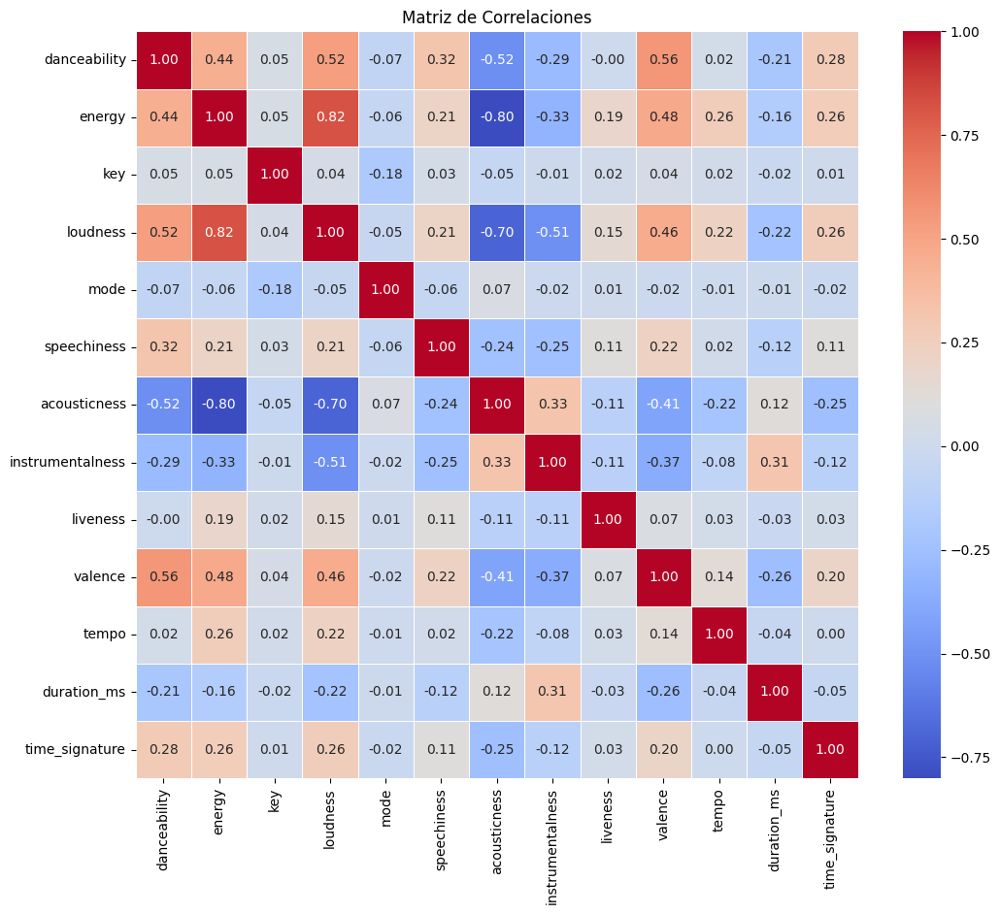

In [ ]:
# Filtramos solo columnas de tipo int64 y float64
numeric_columns = df_spotify_final.select_dtypes(include=['int64', 'float64'])

# matriz de correlaciones
correlation_matrix = numeric_columns.corr()

#  mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title("Matriz de Correlaciones")
plt.show()

Algunas de las correlaciones más relevantes que se observan en la matriz son:

Energía y Volumen: Una correlación positiva fuerte (0.82), indicando que a medida que la energía de una canción aumenta, también lo hace su volumen. Esto tiene sentido, ya que las canciones más energéticas suelen ser más ruidosas y dinámicas.

Acústica y Energía: Una correlación negativa fuerte (-0.80), lo que sugiere que las canciones más acústicas tienden a tener menos energía. Esto también es lógico, ya que las canciones acústicas suelen ser más suaves y tranquilas que las eléctricas o electrónicas.

Acústica y Volumen: También hay una correlación negativa significativa (-0.70) entre estos dos, indicando que las canciones más acústicas suelen ser más silenciosas. Esto se puede explicar por el hecho de que las canciones acústicas se graban con menos instrumentos y efectos que las que usan amplificación o sintetización.

Bailabilidad y Valencia: Una correlación positiva moderada (0.56), lo que indica que las canciones más bailables suelen tener una valencia más alta. La valencia es una medida de la positividad o negatividad que transmite una canción, por lo que se puede inferir que las canciones más bailables son más alegres o festivas.

Instrumentalidad y Acústica: Una correlación positiva moderada (0.33), lo que sugiere que las canciones más instrumentales suelen ser más acústicas. La instrumentalidad es una medida de la presencia de voces humanas en una canción, mientras que la acústica es una medida de la ausencia de sonidos eléctricos o sintetizados. Esto implica que las canciones más instrumentales se basan más en instrumentos naturales o tradicionales que en efectos o procesamientos digitales.

Tempo y Energía: Una correlación positiva débil (0.21), lo que significa que las canciones con un tempo más rápido suelen tener una energía más alta. El tempo es una medida de la velocidad o ritmo de una canción, expresado en pulsaciones por minuto (BPM), mientras que la energía es una medida de la intensidad o actividad de una canción. Esto se puede explicar por el hecho de que las canciones más rápidas suelen ser más dinámicas y estimulantes que las más lentas.

A continuación definimos en df_features las variables que vamos a utilizar para hacer nuestro train test.
Descartamos 'mode' y 'key' por su baja correlación con el resto de variables, y su posible inferencia negativa en nuestro proceso de clasificación de géneros musicales.

In [ ]:
df_features = df_spotify_final.drop(['track_name', 'artist_name', 'album', 'mode', 'key'], axis=1)
df_features

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre
0,0.63,0.62,-10.95,0.04,0.49,0.00,0.20,0.84,103.36,147800,4,blues
1,0.73,0.05,-22.56,0.04,0.91,0.05,0.12,0.42,78.03,338333,4,blues
2,0.70,0.48,-12.21,0.05,0.15,0.03,0.20,0.71,122.86,181786,4,blues
3,0.74,0.44,-9.62,0.04,0.60,0.02,0.61,0.77,114.22,188200,4,blues
4,0.75,0.29,-14.44,0.05,0.66,0.00,0.12,0.57,111.33,143332,4,blues
...,...,...,...,...,...,...,...,...,...,...,...,...
8977,0.78,0.64,-9.45,0.05,0.00,0.76,0.11,0.23,135.34,212160,4,electronic
8978,0.72,0.83,-9.15,0.11,0.01,0.94,0.12,0.42,133.99,317483,3,electronic
8979,0.72,0.65,-11.22,0.05,0.00,0.94,0.12,0.18,130.01,355586,4,electronic
8980,0.76,0.45,-10.23,0.07,0.03,0.86,0.11,0.69,148.00,236333,4,electronic


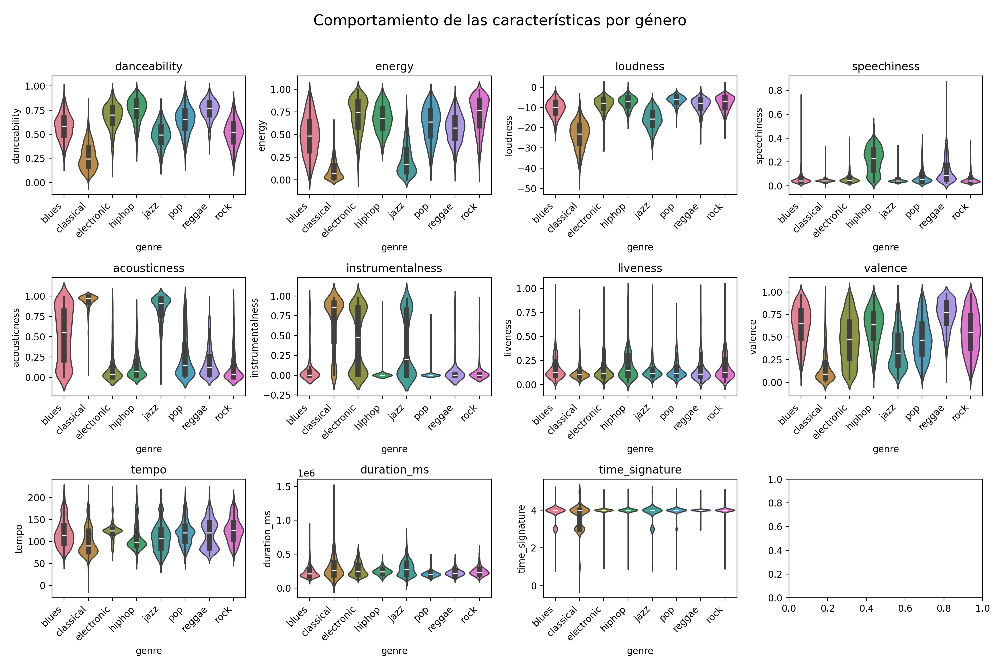

In [ ]:
# Podemos visualizar el comportamiento de las features por género

# Creamos subplots para cada feature
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))
fig.suptitle('Comportamiento de las características por género', fontsize=16)

# features a graficar
features = df_features.columns[:-1]  # Excluir la columna 'genre'

# Colores para cada género
colors = sns.color_palette("husl", n_colors=len(df_features['genre'].unique()))

# Iterar sobre cada feature y dibujar un gráfico para cada una
for i, feature in enumerate(features):
    row = i // 4
    col = i % 4

    # Crear un gráfico de violín para la feature actual
    sns.violinplot(x='genre', y=feature, data=df_features, ax=axes[row, col], palette=colors)
    axes[row, col].set_title(feature)


    axes[row, col].set_xticklabels(axes[row, col].get_xticklabels(), rotation=45, ha='right')

# Ajustamos el diseño
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Mostramos el gráfico
plt.show()

Bailabilidad (danceability): Los géneros pop, hip hop y reggae tienden a tener una alta bailabilidad. Por otro lado, los géneros classical y blues muestran una bailabilidad más baja.

Energía (energy): Los géneros rock, pop y hip hop muestran una alta energía, lo que podría indicar que las canciones de estos géneros son más intensas y rápidas. Por su parte, géneros como classical y jazz tienen valores más bajos, lo que podría indicar que las canciones de estos géneros son más tranquilas y lentas.

Volumen (loudness): Los géneros rock y pop tienden a tener un volumen más alto, lo que podría indicar que las canciones de estos géneros son más ruidosas. En cambio, el género classical muestra un volumen más bajo.

Habla (speechiness): El género hip hop muestra un alto speechiness, lo que indica que las canciones de este género contienen más palabras habladas. Por otro lado, los géneros classical y electronic muestran valores más bajos.

Acústica (acousticness): Los géneros classical y jazz muestran una alta acústica. Por otro lado, los géneros rock y electronic muestran una acústica más baja, esto indica que las canciones de estos géneros son menos propensas a contener sonidos acústicos.

Instrumentalidad (instrumentalness): Los géneros classical y electronic muestran una alta instrumentalidad. Por otro lado, los géneros pop y hip hop muestran una instrumentalidad más baja.

Vivacidad (liveness): Los géneros rock y jazz muestran una alta vivacidad, lo que podría indicar que las canciones de estos géneros son más propensas a contener sonidos de una audiencia en vivo. A diferencia de esto, los géneros pop y electronic muestran una vivacidad más baja.

Valencia (valence): Los géneros pop y reggae muestran una alta valencia, lo que indica que las canciones de estos géneros son más propensas a transmitir una sensación positiva. Géneros blues y classical muestran una valencia más baja, da a entender que las canciones de estos géneros son menos propensas a transmitir una sensación positiva.

Tempo: Los géneros electronic y rock muestran un tempo más rápido. Si lo comparamos con el blues y classical, vemos que éstos tienen un tempo más lento.

Firma de tiempo (time signature): La mayoría de los géneros tienden a tener una firma de tiempo similar, con un patrón rítmico común, como 4/4 (cuatro tiempos por compás), que es muy común en la música popular.

Duración (duration_ms): La duración de una canción puede variar significativamente dependiendo del género. Los géneros classical y jazz podrían tener una duración más larga en promedio, lo que tiene sentido ya que estas canciones a menudo incluyen solos instrumentales largos.


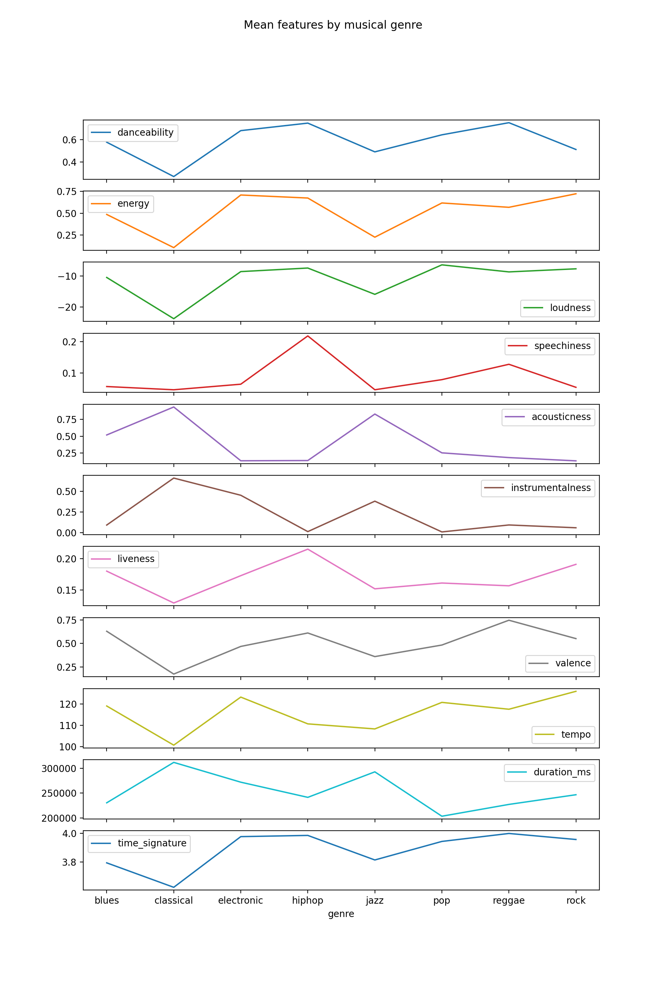

In [ ]:
# Podemos hacer otro tipo de visualización de las features por género. El análisis es el mismo que para el gráfico anterior:

# Agrupamos el dataframe por la columna 'genre' y calculamos la media de las demás columnas
df_mean_by_genre = df_features.groupby("genre").mean()

# Hacemos una gráfica de líneas con el dataframe df_mean_by_genre
df_mean_by_genre.plot(subplots=True, figsize=(10, 15), title="Mean features by musical genre");

Podemos hacer algunos gráficos de barras adicionales, para tener únicamente otro tipo de visualización (ofrecen la misma información)

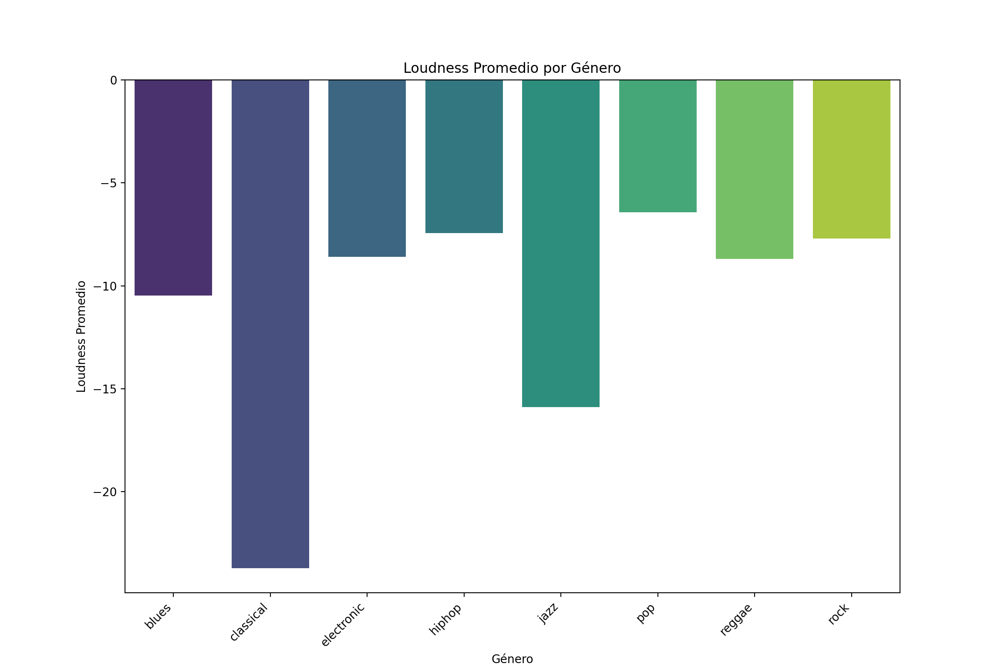

In [ ]:
# gráfico de barras loudness por género
plt.figure(figsize=(12, 8))
sns.barplot(x='genre', y='loudness', data=df_features, ci=None, estimator='mean', palette='viridis')
plt.title('Loudness Promedio por Género')
plt.xlabel('Género')
plt.ylabel('Loudness Promedio')
plt.xticks(rotation=45, ha='right')
plt.show()

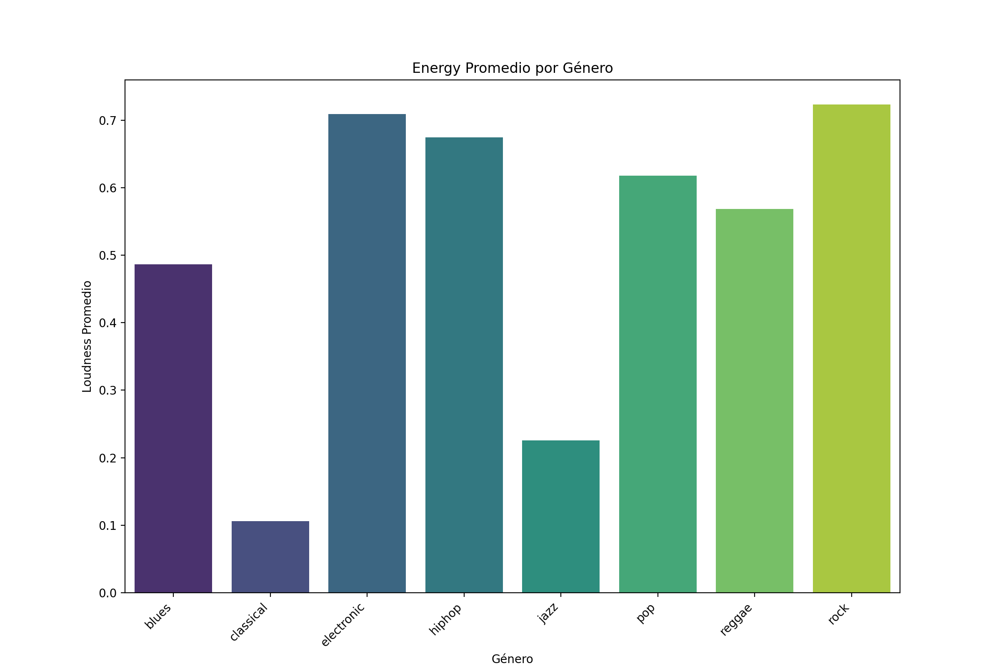

In [ ]:
# gráfico de barras energy por género
plt.figure(figsize=(12, 8))
sns.barplot(x='genre', y='energy', data=df_features, ci=None, estimator='mean', palette='viridis')
plt.title('Energy Promedio por Género')
plt.xlabel('Género')
plt.ylabel('Loudness Promedio')
plt.xticks(rotation=45, ha='right')
plt.show()

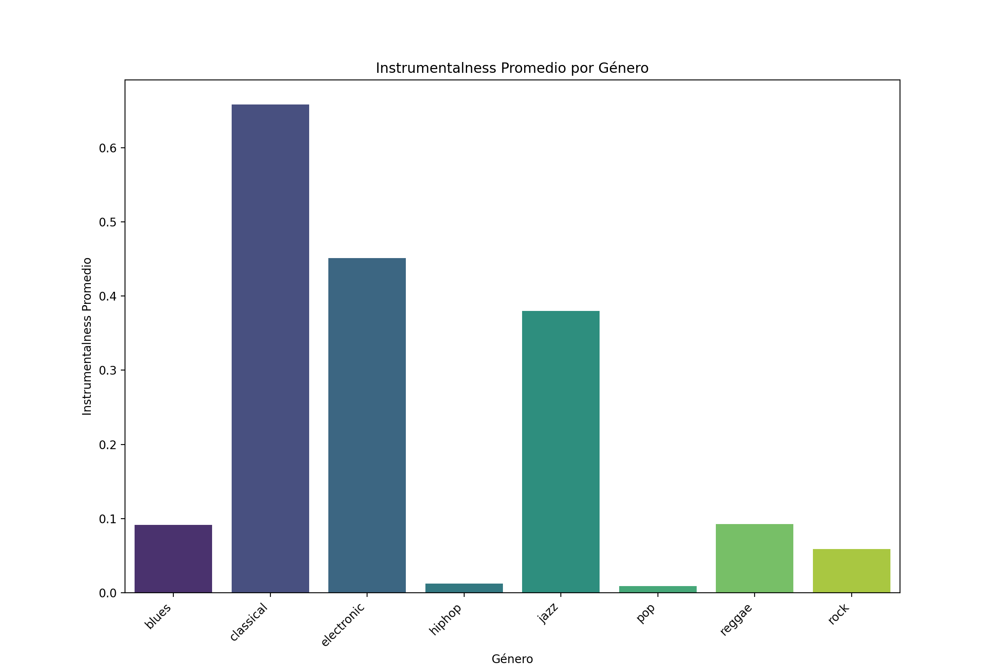

In [ ]:
# gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(x='genre', y='instrumentalness', data=df_features, ci=None, estimator='mean', palette='viridis')
plt.title('Instrumentalness Promedio por Género')
plt.xlabel('Género')
plt.ylabel('Instrumentalness Promedio')
plt.xticks(rotation=45, ha='right')
plt.show()

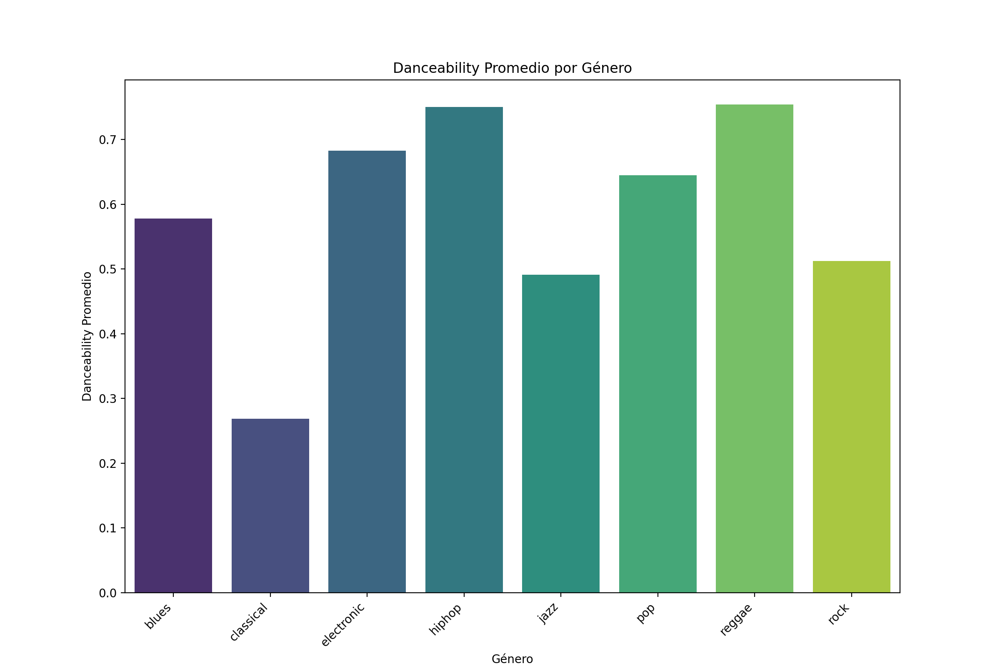

In [ ]:
# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(x='genre', y='danceability', data=df_features, ci=None, estimator='mean', palette='viridis')
plt.title('Danceability Promedio por Género')
plt.xlabel('Género')
plt.ylabel('Danceability Promedio')
plt.xticks(rotation=45, ha='right')
plt.show()

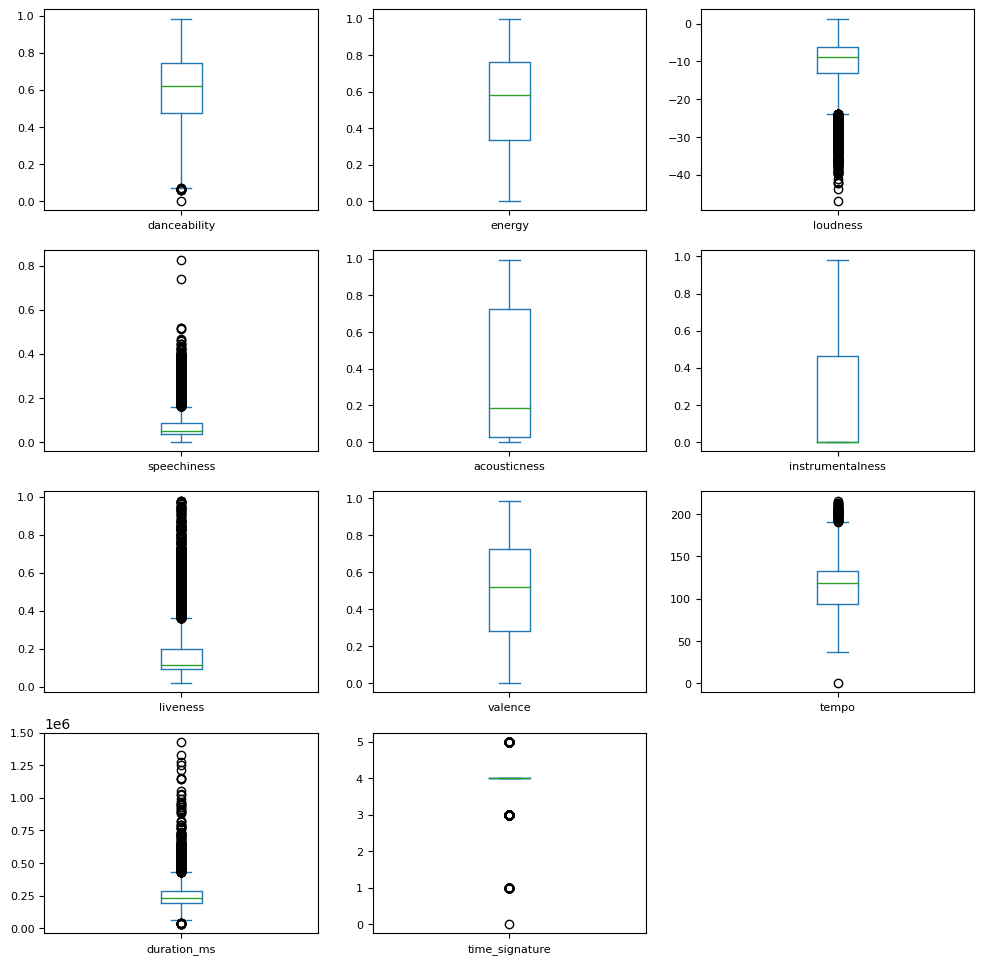

In [ ]:
df_features.plot(kind='box',subplots=True, layout=(4,3), fontsize=8, figsize=(12,12));

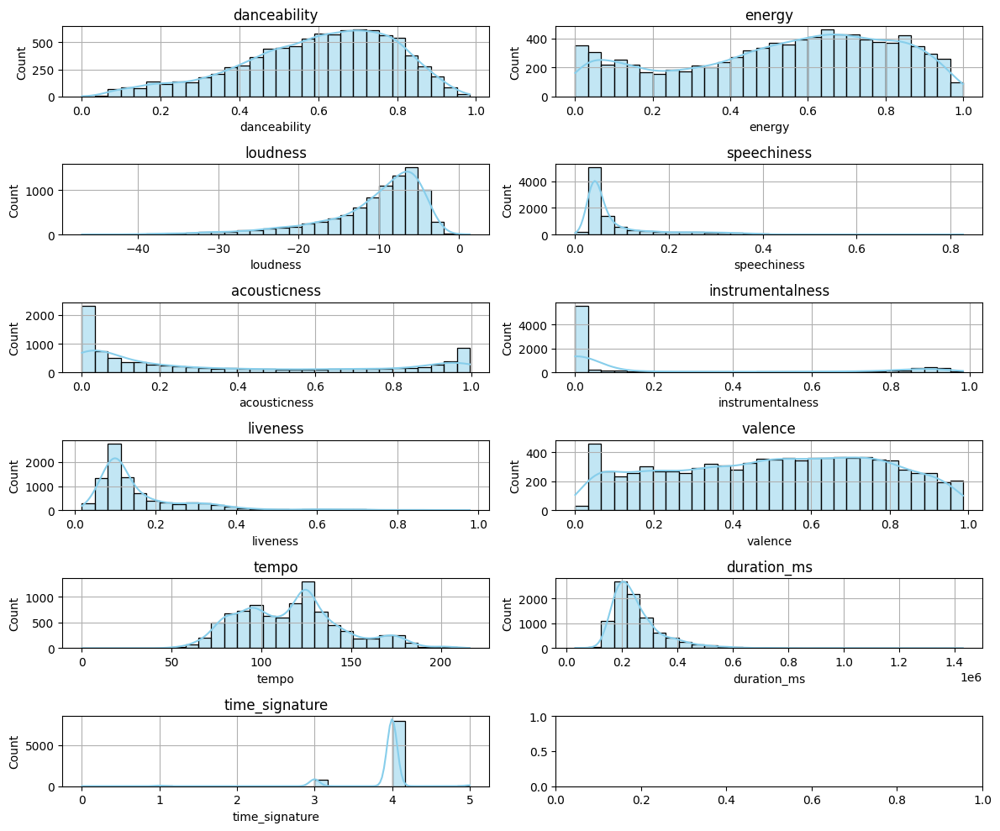

In [ ]:
# Filtramos solo columnas de tipo int64 y float64
columnas_numericas = df_features.select_dtypes(include=['int64', 'float64'])

# Calculamos el número necesario de filas y columnas para los subgráficos
num_plots = len(columnas_numericas.columns)
num_cols = 2
num_rows = math.ceil(num_plots / num_cols)

# Creamos histogramas y KDE para cada columna
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 10))

for i, columna in enumerate(columnas_numericas.columns):
    sns.histplot(df_features[columna], bins=30, kde=True, color='skyblue', edgecolor='black', ax=axs[i // num_cols, i % num_cols])
    axs[i // num_cols, i % num_cols].set_title(columna)
    axs[i // num_cols, i % num_cols].grid(True)

# Ajustamos el diseño
fig.tight_layout()
plt.show()



In [ ]:
# TEST SHAPIRO

import pandas as pd
from scipy.stats import shapiro

columnas = ['danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
            'duration_ms', 'time_signature']

 #Realizamos el test de Shapiro-Wilk para cada columna
for column in columnas:
    stat, p = shapiro(df_features[column])
    print(f'Columna: {column}, Estadística: {stat:.3f}, p-valor: {p:.3f}')

Columna: danceability, Estadística: 0.969, p-valor: 0.000
Columna: energy, Estadística: 0.950, p-valor: 0.000
Columna: loudness, Estadística: 0.861, p-valor: 0.000
Columna: speechiness, Estadística: 0.668, p-valor: 0.000
Columna: acousticness, Estadística: 0.818, p-valor: 0.000
Columna: instrumentalness, Estadística: 0.653, p-valor: 0.000
Columna: liveness, Estadística: 0.725, p-valor: 0.000
Columna: valence, Estadística: 0.963, p-valor: 0.000
Columna: tempo, Estadística: 0.980, p-valor: 0.000
Columna: duration_ms, Estadística: 0.807, p-valor: 0.000
Columna: time_signature, Estadística: 0.377, p-valor: 0.000


En los gráficos anteriores (boxplots e histogranas) ya habíamos visualizado que ninguna de las variables sigue una distribución normal, además de la presencia de outliers en algunas de ellas. Tras realizar el test de Shapiro-Wilk, nos confirma que podemos rechazar la hipótesis nula de que las variables siguen una distribución normal o gaussiana, ya que el p-value es menor a 0.05. (Todas tienen un p-value de 0.000)

Una vez definido el dataframe que vamos a utilizar para entrenar, definimos 'X' e 'y' (target), y a su vez aplicaremos un label coder al target 'y'.
Después hacemos la división train test.

In [ ]:
X = df_features.drop('genre', axis=1)
y = df_features['genre']

# Aplicamos LabelEncoder a la variable objetivo
le = LabelEncoder()
y = le.fit_transform(y)

# Dividimos los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Podemos visualizar, para nuestra propia información, a qué código pertenece cada género:

In [ ]:
# Obtener los equivalentes originales y sus códigos
equivalentes_originales = le.classes_
codigos_asignados = le.transform(equivalentes_originales)

# Visualizamos los equivalentes originales y sus códigos
for codigo, equivalente_original in zip(codigos_asignados, equivalentes_originales):
    print(f"Código: {codigo}, Equivalente Original: {equivalente_original}")


Código: 0, Equivalente Original: blues
Código: 1, Equivalente Original: classical
Código: 2, Equivalente Original: electronic
Código: 3, Equivalente Original: hiphop
Código: 4, Equivalente Original: jazz
Código: 5, Equivalente Original: pop
Código: 6, Equivalente Original: reggae
Código: 7, Equivalente Original: rock


In [ ]:
df_features.columns

Index(['danceability', 'energy', 'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature', 'genre'],
      dtype='object')

Procedemos a realizar el escalado de las variables. Hemos visto que no siguen una distribución normal y algunas de ellas tienen outliers. En ese caso, pensaríamos en hacer un Robust Scaler para las variables con outliers, y un MinMax Scaler para las variables sin outliers. Pero en la práctica, esta diferencia de escalados no da los resultados esperados en la clasificación de géneros. Optamos en nuestro caso, a efectuar un Robust Scaler a todas las variables, independientemente de si tienen outliers o no. Más adelante veremos (al aplicar el mejor modelo al segundo dataset) que los resultados obtenidos son más que satisfactorios.

In [ ]:
# Inicializar el RobustScaler
robust_scaler = RobustScaler()

# Ajustar y transformar los datos de entrenamiento
X_train_scaled = robust_scaler.fit_transform(X_train)

# Solo transformar los datos de prueba (no volver a ajustar para evitar data leakage)
X_test_scaled = robust_scaler.transform(X_test)

Aplicamos Lazy Classifier para conocer la aplicación de qué modelo es el más adecuado. En nuestro caso vemos que Random Forest Classifier ofrece el mejor rendimiento, con un Accuracy y un F1 Score de 0.71.

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
models

 97%|█████████▋| 28/29 [00:52<00:01,  1.15s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2552
[LightGBM] [Info] Number of data points in the train set: 7185, number of used features: 11
[LightGBM] [Info] Start training from score -2.200152
[LightGBM] [Info] Start training from score -2.259678
[LightGBM] [Info] Start training from score -1.669671
[LightGBM] [Info] Start training from score -2.169228
[LightGBM] [Info] Start training from score -2.180250
[LightGBM] [Info] Start training from score -1.995264
[LightGBM] [Info] Start training from score -2.208984
[LightGBM] [Info] Start training from score -2.091906


100%|██████████| 29/29 [00:54<00:00,  1.88s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.71,0.70,None,0.71,2.41
XGBClassifier,0.70,0.69,None,0.69,2.19
ExtraTreesClassifier,0.70,0.69,None,0.70,2.11
LGBMClassifier,0.69,0.69,None,0.69,1.79
SVC,0.68,0.68,None,0.68,3.19
NuSVC,0.66,0.65,None,0.66,4.03
BaggingClassifier,0.66,0.65,None,0.66,1.15
QuadraticDiscriminantAnalysis,0.64,0.64,None,0.64,0.03
LogisticRegression,0.64,0.63,None,0.64,0.28


Inicializamos el modelo Random Forest Classifier:

In [ ]:
# clasificador de Random Forest
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

In [ ]:
# Entrenamos el modelo
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Realizamos predicciones en el conjunto de prueba
y_pred_rf = rf_clf.predict(X_test)
# informe de clasificación
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.58      0.54      0.56       193
           1       0.90      0.85      0.87       200
           2       0.80      0.78      0.79       358
           3       0.71      0.78      0.75       198
           4       0.67      0.71      0.69       177
           5       0.64      0.68      0.66       239
           6       0.68      0.63      0.66       209
           7       0.64      0.65      0.64       223

    accuracy                           0.71      1797
   macro avg       0.70      0.70      0.70      1797
weighted avg       0.71      0.71      0.71      1797



Se confirman los resultados ya obtenidos con el Lazy Classifier. Obtenemos hiperparámetros:

In [ ]:
rf_clf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

Ajustamos hiperparámetros:

In [ ]:
param_dist_rf = {
    'n_estimators': [int(x) for x in np.linspace(start=100, stop=500, num=5)],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [int(x) for x in np.linspace(10, 50, num=5)] + [None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]

}




Hacemos Randomized Search. Dada la complejidad del modelo y alto número de datos a procesar, la opción de GridSearch tiene un alto coste computacional, y optamos por tanto por Randomized Search, el cual ofrece resultados similares con un coste computacional no tan elevado.

In [ ]:
random_search_rf = RandomizedSearchCV(rf_clf, param_dist_rf, n_iter=50, cv=5, verbose = 2, scoring='accuracy', n_jobs=-1)


In [ ]:
random_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500]},
                   scoring='accuracy', verbose=2)

Obtenemos los mejores hiperparámetros:

In [ ]:
# mejores parámetros encontrados
best_params_rf = random_search_rf.best_params_
print("Mejores hiperparámetros encontrados:", best_params_rf)

Mejores hiperparámetros encontrados: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 30, 'bootstrap': True}


Obtenemos el mejor modelo. No hay una mejora. Los resultados siguen siendo los mismos. Confirma un Accuracy y F1 Score de 0.71

In [ ]:
best_model_rf = random_search_rf.best_estimator_
y_pred_rf = best_model_rf.predict(X_test)


print("Informe de clasificación:\n", classification_report(y_test, y_pred_rf))

Informe de clasificación:
               precision    recall  f1-score   support

           0       0.60      0.55      0.58       193
           1       0.91      0.84      0.87       200
           2       0.80      0.78      0.79       358
           3       0.72      0.76      0.74       198
           4       0.66      0.74      0.70       177
           5       0.63      0.67      0.65       239
           6       0.67      0.63      0.65       209
           7       0.65      0.66      0.66       223

    accuracy                           0.71      1797
   macro avg       0.71      0.70      0.70      1797
weighted avg       0.71      0.71      0.71      1797



Creamos la matriz de confusión:

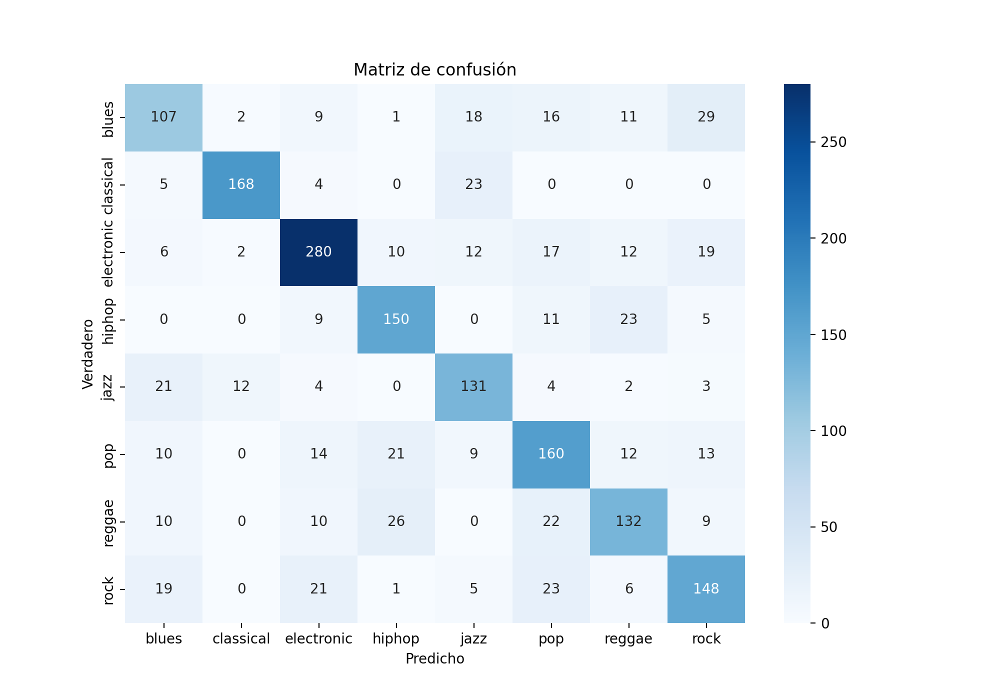

In [ ]:
# Definimos el orden y los nombres de las clases
classes = [0, 1, 2, 3, 4, 5, 6, 7]

names = ["blues", "classical", "electronic", "hiphop", "jazz", "pop", "reggae", "rock"]



# matriz de confusión
cm = confusion_matrix(y_test, y_pred_rf, labels=clases)

# Visualizamos la matriz de confusión
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=names, yticklabels=names)
plt.title('Matriz de confusión')
plt.ylabel('Verdadero')
plt.xlabel('Predicho')
plt.show()

Al observar la diagonal de la matriz de confusión, podemos verificar un grado de acierto bastante aceptable en la predicción de géneros, alcanzando un 71% de precisión según nuestro modelo. Sin embargo, también notamos un porcentaje de error en la asignación (exceptuando la música clásica que es el género que mejor se clasifica):

Blues: Clasifica ocasionalmente erróneamente géneros como jazz, pop, reggae y rock. El rock y el jazz tienen raíces en el blues, lo que puede llevar a confusiones en la clasificación.
Classical: La clasificación es altamente precisa, clasifica como música clásica algunas pistas de jazz, y puede tener alguna confusión con el blues y la electrónica. Esto podría deberse a la influencia directa de la música clásica en los 2 primeros géneros.
Electronic: Puede clasificar como electrónica a la música rock, pop y hip hop, ya que estos géneros a menudo incorporan elementos electrónicos en sus composiciones.
Hip Hop: En ocasiones, puede clasificar géneros como reggae, pop y electrónico. Esto refleja la naturaleza fusionada del hip hop, que incorpora elementos de diversos géneros musicales.
Jazz: Proviene del blues y la música clásica, lo que puede resultar en clasificaciones erróneas como estos estilos en algunas ocasiones.
Pop: A excepción de la música clásica, el pop tiende a adoptar aspectos de varios géneros, lo que contribuye al número de clasificaciones no acertadas.
Reggae: Nace del ska y se mezcla con influencias como el country, soul, blues y rock, lo que se refleja en la matriz de confusión.
Rock: La dificultad en su clasificación radica en que el rock deriva del blues y puede incorporar elementos de la electrónica, como sintetizadores y samplers. Esto contribuye a las dificultades observadas en la matriz de confusión.

Pasamos a realizar el cross validation de nuestro modelo. con una precisión de 0.701, valida nuestro modelo Random Forest.

In [ ]:
# Realizamos validación cruzada
cv_scores_rf = cross_val_score(best_model_rf, X_train, y_train, cv=5, scoring='accuracy')


print("Resultados de Validación Cruzada:")
print("Precisión en cada pliegue:", cv_scores_rf)
print("Precisión media:", cv_scores_rf.mean())
print("Desviación estándar de la precisión:", cv_scores_rf.std())

Resultados de Validación Cruzada:
Precisión en cada pliegue: [0.71398747 0.68128045 0.70772443 0.70702853 0.69171886]
Precisión media: 0.700347947112039
Desviación estándar de la precisión: 0.012025889813348905


La validación cruzada valida el rendimiento de nuestro modelo.

Vamos a continuación a visualizar la importancia de los features (características), para conocer qué peso tiene cada uno de ellos para determinar la clasificación de géneros:

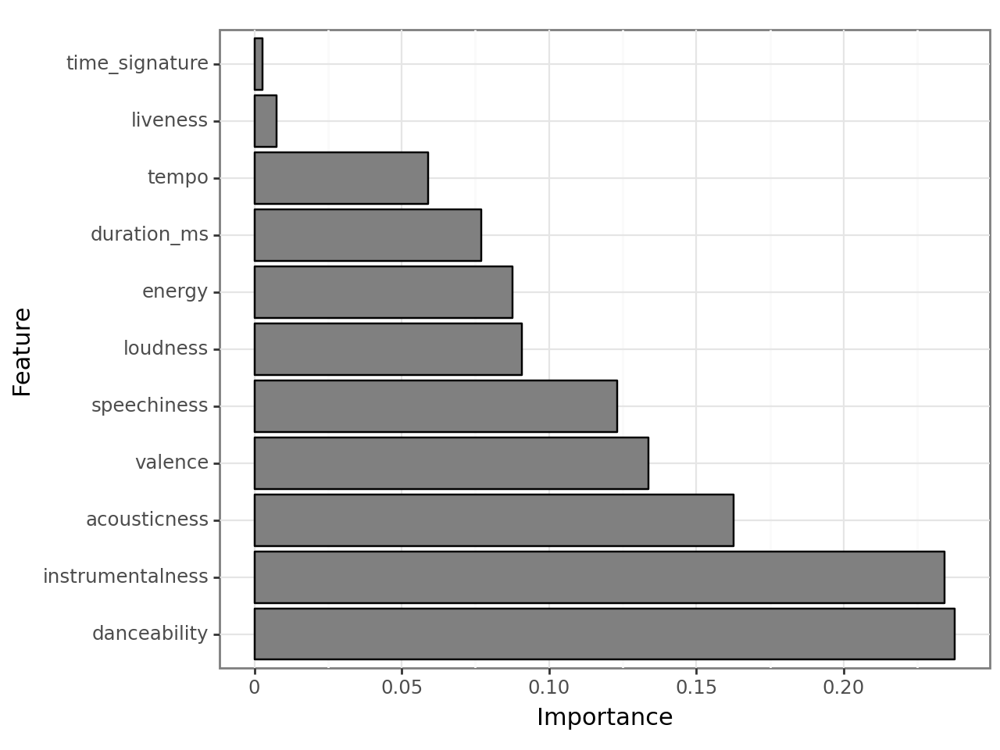

<Figure Size: (640 x 480)>

In [ ]:
# Calcular la importancia de las features por permutación
result = permutation_importance(
    rf_clf, X, y, n_repeats=10, random_state=42, n_jobs=2
)

# Crear un dataframe con los resultados
feature_names = X.columns
importances = result.importances_mean
std = result.importances_std
df_importances = pd.DataFrame(
    {"feature": feature_names, "importance": importances, "std": std}
)

# Ordenar el dataframe por importancia decreciente
df_importances = df_importances.sort_values(by="importance", ascending=False)

# Convertir la feature en un factor ordenado
df_importances["feature"] = pd.Categorical(
    df_importances["feature"], categories=df_importances["feature"], ordered=True
)

# Hacemos una gráfica de barras con ggplot2
(ggplot(df_importances, aes(x="feature", y="importance")) +
 geom_col(fill="grey", color="black") +
 coord_flip() +
 labs(x="Feature", y="Importance") +
 theme_bw())

Vemos que características son más o menos importantes para la clasificación de géneros. La bailabilidad y la instrumentalidad tienen una alta importancia. La acústica, valencia, habla, volumen y energía tienen una importancia moderada. Duración y tempo tienen una importancia moderadamente baja. La vivacidad y la firma de tiempo son las de menor importancia.


--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
***PARTE II: Aplicamos las predicciones a un segundo dataset con más de 1 millón de canciones. Este dataset carece de géneros musicales, y ese es nuestro objetivo, aplicar el modelo obtenido a este nuevo dataset para que nos clasifique las canciones por género. ***

Cargamos este nuevo dataset (df_predictions):

In [ ]:
df_predictions = pd.read_csv('tracks_features.csv')

df_predictions


,id,name,album,album_id,artists,artist_ids,track_number,disc_number,explicit,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year,release_date
0,7lmeHLHBe4nmXzuXc0HDjk,Testify,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],1.00,1.00,False,0.47,...,0.07,0.03,0.00,0.36,0.50,117.91,210133.00,4.00,1999.00,1999-11-02
1,1wsRitfRRtWyEapl0q22o8,Guerrilla Radio,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],2.00,1.00,True,0.60,...,0.19,0.01,0.00,0.15,0.49,103.68,206200.00,4.00,1999.00,1999-11-02
2,1hR0fIFK2qRG3f3RF70pb7,Calm Like a Bomb,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],3.00,1.00,False,0.32,...,0.48,0.02,0.00,0.12,0.37,149.75,298893.00,4.00,1999.00,1999-11-02
3,2lbASgTSoDO7MTuLAXlTW0,Mic Check,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],4.00,1.00,True,0.44,...,0.24,0.16,0.00,0.12,0.57,96.75,213640.00,4.00,1999.00,1999-11-02
4,1MQTmpYOZ6fcMQc56Hdo7T,Sleep Now In the Fire,The Battle Of Los Angeles,2eia0myWFgoHuttJytCxgX,['Rage Against The Machine'],['2d0hyoQ5ynDBnkvAbJKORj'],5.00,1.00,False,0.43,...,0.07,0.00,0.10,0.08,0.54,127.06,205600.00,4.00,1999.00,1999-11-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140947,78pDVGo1Cjj1e81z8JJoK6,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),4tbNTPOYzfD13oC1UpSHoQ,['Whitesnake'],['3UbyYnvNIT5DFXU4WgiGpP'],8.00,2.00,False,0.62,...,0.06,0.02,0.14,0.24,0.39,132.53,220646.00,4.00,2019.00,2019-03-08
1140948,2ZWrIVLD6mnFSw0CqyI6WK,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),4tbNTPOYzfD13oC1UpSHoQ,['Whitesnake'],['3UbyYnvNIT5DFXU4WgiGpP'],9.00,2.00,False,0.47,...,0.05,0.01,0.00,0.12,0.72,132.31,254125.00,4.00,2019.00,2019-03-08
1140949,5xs8x2Jcth1GdM2AyfD1PB,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),4tbNTPOYzfD13oC1UpSHoQ,['Whitesnake'],['3UbyYnvNIT5DFXU4WgiGpP'],10.00,2.00,False,0.44,...,0.08,0.04,0.02,0.33,0.65,174.23,203799.00,4.00,2019.00,2019-03-08
1140950,4pXFNBpsQatvDv2YqKoQGr,Need Your Love so Bad - 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),4tbNTPOYzfD13oC1UpSHoQ,['Whitesnake'],['3UbyYnvNIT5DFXU4WgiGpP'],11.00,2.00,False,0.26,...,0.03,0.40,0.00,0.51,0.06,107.88,193766.00,3.00,2019.00,2019-03-08


Visualizamos los tipos de variables:

In [ ]:
df_predictions.dtypes

id                   object
name                 object
album                object
album_id             object
artists              object
artist_ids           object
track_number        float64
disc_number         float64
explicit             object
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms         float64
time_signature      float64
year                float64
release_date         object
dtype: object

Eliminamos las columnas que no necesitamos. El dataset pasa a llamarse df_predictions_cleaned:

In [ ]:
df_predictions_cleaned = df_predictions.drop(['id', 'album_id', 'artist_ids',
                'track_number','disc_number','explicit','release_date'], axis=1)




In [ ]:
df_predictions_cleaned.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year
count,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00,1140951.00
mean,0.49,0.51,5.19,-11.87,0.67,0.08,0.45,0.28,0.20,0.43,117.58,249424.55,3.83,2007.07
std,0.19,0.30,3.54,7.02,0.47,0.11,0.39,0.38,0.18,0.27,30.94,162186.30,0.56,12.11
min,0.00,0.00,0.00,-60.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1000.00,0.00,0.00
25%,0.35,0.25,2.00,-15.37,0.00,0.04,0.04,0.00,0.10,0.19,94.04,174533.00,4.00,2002.00
50%,0.50,0.52,5.00,-9.83,1.00,0.04,0.40,0.01,0.12,0.40,116.59,225000.00,4.00,2008.00
75%,0.63,0.77,8.00,-6.73,1.00,0.07,0.86,0.72,0.24,0.65,136.99,286759.00,4.00,2015.00
max,1.00,1.00,11.00,7.23,1.00,0.97,1.00,1.00,1.00,1.00,248.93,6061090.00,5.00,2020.00


Comprobamos si hay valores nulos:

In [ ]:
df_predictions_cleaned.isnull().sum()

name                0
album               0
artists             0
danceability        1
energy              1
key                 1
loudness            1
mode                1
speechiness         1
acousticness        1
instrumentalness    1
liveness            1
valence             1
tempo               1
duration_ms         1
time_signature      1
year                1
dtype: int64

In [ ]:
filas_con_nulos = df_predictions_cleaned.isnull().any(axis=1)


print("Filas con al menos un valor nulo:")
df_predictions_cleaned[filas_con_nulos]

Filas con al menos un valor nulo:


,name,album,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year
1140951,"Gambler - Eddie Kramer Mix, 1983; 2019 Remaster",Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Eliminamos los valores nulos (están todos en una única fila) y renombramos el dataset como: 'df_predictions_final':

In [ ]:
df_predictions_final = df_predictions_cleaned.dropna()

df_predictions_final

,name,album,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year
0,Testify,The Battle Of Los Angeles,['Rage Against The Machine'],0.47,0.98,7.00,-5.40,1.00,0.07,0.03,0.00,0.36,0.50,117.91,210133.00,4.00,1999.00
1,Guerrilla Radio,The Battle Of Los Angeles,['Rage Against The Machine'],0.60,0.96,11.00,-5.76,1.00,0.19,0.01,0.00,0.15,0.49,103.68,206200.00,4.00,1999.00
2,Calm Like a Bomb,The Battle Of Los Angeles,['Rage Against The Machine'],0.32,0.97,7.00,-5.42,1.00,0.48,0.02,0.00,0.12,0.37,149.75,298893.00,4.00,1999.00
3,Mic Check,The Battle Of Los Angeles,['Rage Against The Machine'],0.44,0.97,11.00,-5.83,0.00,0.24,0.16,0.00,0.12,0.57,96.75,213640.00,4.00,1999.00
4,Sleep Now In the Fire,The Battle Of Los Angeles,['Rage Against The Machine'],0.43,0.93,2.00,-6.73,1.00,0.07,0.00,0.10,0.08,0.54,127.06,205600.00,4.00,1999.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140946,Hungry for Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.63,0.95,2.00,-6.43,1.00,0.05,0.02,0.00,0.16,0.51,134.74,237761.00,4.00,2019.00
1140947,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.62,0.94,2.00,-7.32,0.00,0.06,0.02,0.14,0.24,0.39,132.53,220646.00,4.00,2019.00
1140948,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.47,0.93,9.00,-7.06,1.00,0.05,0.01,0.00,0.12,0.72,132.31,254125.00,4.00,2019.00
1140949,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.44,0.97,6.00,-5.49,0.00,0.08,0.04,0.02,0.33,0.65,174.23,203799.00,4.00,2019.00


La variable 'year' aparece como float. Convertimos 'year' a integer (int64):

In [ ]:
df_predictions_final['year'] = df_predictions_final['year'].astype('int64')

In [ ]:
df_predictions_final.reset_index(drop=True, inplace=True)

df_predictions_final

,name,album,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year
0,Testify,The Battle Of Los Angeles,['Rage Against The Machine'],0.47,0.98,7.00,-5.40,1.00,0.07,0.03,0.00,0.36,0.50,117.91,210133.00,4.00,1999
1,Guerrilla Radio,The Battle Of Los Angeles,['Rage Against The Machine'],0.60,0.96,11.00,-5.76,1.00,0.19,0.01,0.00,0.15,0.49,103.68,206200.00,4.00,1999
2,Calm Like a Bomb,The Battle Of Los Angeles,['Rage Against The Machine'],0.32,0.97,7.00,-5.42,1.00,0.48,0.02,0.00,0.12,0.37,149.75,298893.00,4.00,1999
3,Mic Check,The Battle Of Los Angeles,['Rage Against The Machine'],0.44,0.97,11.00,-5.83,0.00,0.24,0.16,0.00,0.12,0.57,96.75,213640.00,4.00,1999
4,Sleep Now In the Fire,The Battle Of Los Angeles,['Rage Against The Machine'],0.43,0.93,2.00,-6.73,1.00,0.07,0.00,0.10,0.08,0.54,127.06,205600.00,4.00,1999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140946,Hungry for Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.63,0.95,2.00,-6.43,1.00,0.05,0.02,0.00,0.16,0.51,134.74,237761.00,4.00,2019
1140947,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.62,0.94,2.00,-7.32,0.00,0.06,0.02,0.14,0.24,0.39,132.53,220646.00,4.00,2019
1140948,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.47,0.93,9.00,-7.06,1.00,0.05,0.01,0.00,0.12,0.72,132.31,254125.00,4.00,2019
1140949,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),['Whitesnake'],0.44,0.97,6.00,-5.49,0.00,0.08,0.04,0.02,0.33,0.65,174.23,203799.00,4.00,2019


Eliminamos los corchetes y las comillas de los strings de la columna 'artists'

In [ ]:
df_predictions_final['artists'] = df_predictions_final['artists'].str.replace("[", "")
df_predictions_final['artists'] = df_predictions_final['artists'].str.replace("]", "")
df_predictions_final['artists'] = df_predictions_final['artists'].str.replace("'", "")

print(df_predictions_final['artists'])

0          Rage Against The Machine
1          Rage Against The Machine
2          Rage Against The Machine
3          Rage Against The Machine
4          Rage Against The Machine
                     ...           
1140946                  Whitesnake
1140947                  Whitesnake
1140948                  Whitesnake
1140949                  Whitesnake
1140950                  Whitesnake
Name: artists, Length: 1140951, dtype: object


In [ ]:
df_predictions_final.columns

Index(['name', 'album', 'artists', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'year'],
      dtype='object')

Seleccionamos en un dataframe a parte (df_features_2), las mismas variables que hemos empleado en el entrenamiento del modelo Random Forest. Para ello haremos un drop de las que no necesitamos:

In [ ]:
df_features_2 = df_predictions_final.drop([ 'name', 'album','artists','year','mode','key'], axis=1)

In [ ]:
df_features_2

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0.47,0.98,-5.40,0.07,0.03,0.00,0.36,0.50,117.91,210133.00,4.00
1,0.60,0.96,-5.76,0.19,0.01,0.00,0.15,0.49,103.68,206200.00,4.00
2,0.32,0.97,-5.42,0.48,0.02,0.00,0.12,0.37,149.75,298893.00,4.00
3,0.44,0.97,-5.83,0.24,0.16,0.00,0.12,0.57,96.75,213640.00,4.00
4,0.43,0.93,-6.73,0.07,0.00,0.10,0.08,0.54,127.06,205600.00,4.00
...,...,...,...,...,...,...,...,...,...,...,...
1140946,0.63,0.95,-6.43,0.05,0.02,0.00,0.16,0.51,134.74,237761.00,4.00
1140947,0.62,0.94,-7.32,0.06,0.02,0.14,0.24,0.39,132.53,220646.00,4.00
1140948,0.47,0.93,-7.06,0.05,0.01,0.00,0.12,0.72,132.31,254125.00,4.00
1140949,0.44,0.97,-5.49,0.08,0.04,0.02,0.33,0.65,174.23,203799.00,4.00


Visualizamos las variables con boxplot.

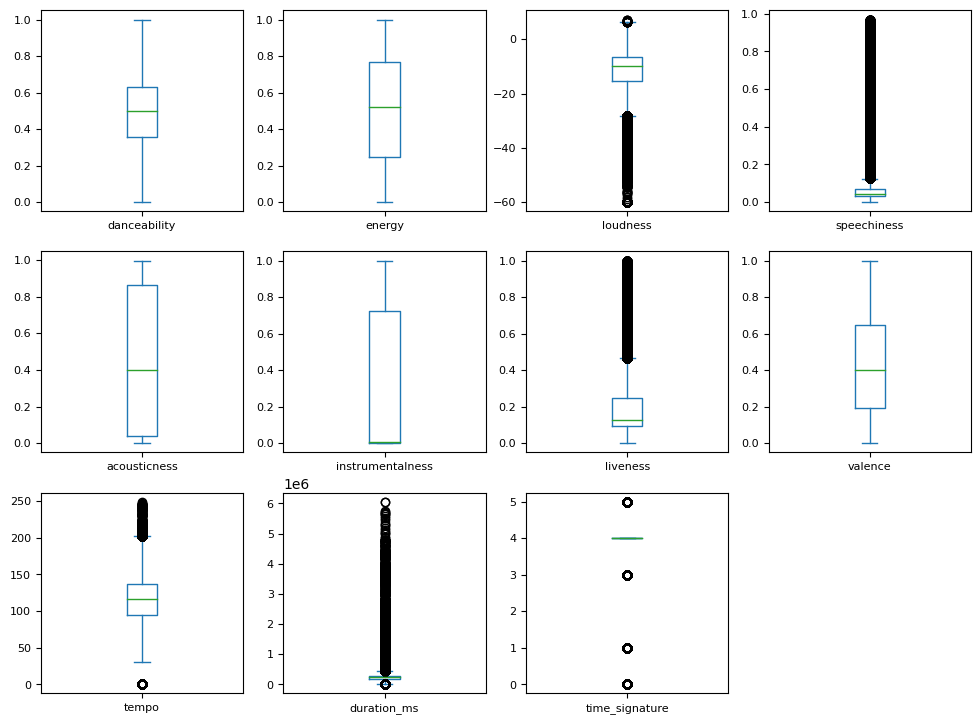

In [ ]:
df_features_2.plot(kind='box',subplots=True, layout=(4,4), fontsize=8, figsize=(12,12));

Aplicaremos Robust Scaler a todo el dataframe (df_features_2). El escalado debe ser el mismo, en caso contrario los resultados de aplicar el modelo se distorsionarían.

In [ ]:
# Inicializar el RobustScaler
robust_scaler = RobustScaler()

# Ajustar y transformar todos los datos
df_features_2_scaled = robust_scaler.fit_transform(df_features_2)

# Crear un nuevo DataFrame con los datos escalados
df_features_2_scaled = pd.DataFrame(df_features_2_scaled, columns=df_features_2.columns)

# Mostrar el DataFrame escalado
df_features_2_scaled

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,-0.11,0.88,0.51,0.79,-0.45,-0.01,1.56,0.22,0.03,-0.13,0.00
1,0.36,0.84,0.47,3.99,-0.47,-0.01,0.20,0.19,-0.30,-0.17,0.00
2,-0.67,0.87,0.51,12.18,-0.45,-0.01,-0.02,-0.07,0.77,0.66,0.00
3,-0.21,0.86,0.46,5.35,-0.29,-0.01,-0.03,0.38,-0.46,-0.10,0.00
4,-0.26,0.79,0.36,0.71,-0.48,0.13,-0.31,0.30,0.24,-0.17,0.00
...,...,...,...,...,...,...,...,...,...,...,...
1140946,0.46,0.84,0.39,0.10,-0.46,-0.01,0.22,0.23,0.42,0.11,0.00
1140947,0.45,0.80,0.29,0.54,-0.46,0.19,0.81,-0.03,0.37,-0.04,0.00
1140948,-0.09,0.78,0.32,0.05,-0.47,-0.01,-0.06,0.70,0.37,0.26,0.00
1140949,-0.23,0.86,0.50,0.93,-0.43,0.02,1.36,0.55,1.34,-0.19,0.00


Ahora aplicamos nuestro mejor modelo obtenido con Random Forest al conjunto de datos:

In [ ]:
# Realizamos predicciones en este segundo conjunto de datos
predicted_genres = best_model_rf.predict(df_features_2)

In [ ]:
predicted_genres

array([7, 7, 7, ..., 7, 7, 7])

Una vez obtebido el array con los géneros predichos (predicted_genres), los adjuntamos en una nueva columna, que creamos en nuestro dataframe 'df_predictions_final'. Podemos ver la asignación de género a cada una de las canciones:

In [ ]:
df_predictions_final['predicted_genre'] = predicted_genres

In [ ]:
df_predictions_final

,name,album,artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,year,predicted_genre
0,Testify,The Battle Of Los Angeles,Rage Against The Machine,0.47,0.98,7.00,-5.40,1.00,0.07,0.03,0.00,0.36,0.50,117.91,210133.00,4.00,1999,7
1,Guerrilla Radio,The Battle Of Los Angeles,Rage Against The Machine,0.60,0.96,11.00,-5.76,1.00,0.19,0.01,0.00,0.15,0.49,103.68,206200.00,4.00,1999,7
2,Calm Like a Bomb,The Battle Of Los Angeles,Rage Against The Machine,0.32,0.97,7.00,-5.42,1.00,0.48,0.02,0.00,0.12,0.37,149.75,298893.00,4.00,1999,7
3,Mic Check,The Battle Of Los Angeles,Rage Against The Machine,0.44,0.97,11.00,-5.83,0.00,0.24,0.16,0.00,0.12,0.57,96.75,213640.00,4.00,1999,3
4,Sleep Now In the Fire,The Battle Of Los Angeles,Rage Against The Machine,0.43,0.93,2.00,-6.73,1.00,0.07,0.00,0.10,0.08,0.54,127.06,205600.00,4.00,1999,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1140946,Hungry for Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,0.63,0.95,2.00,-6.43,1.00,0.05,0.02,0.00,0.16,0.51,134.74,237761.00,4.00,2019,7
1140947,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,0.62,0.94,2.00,-7.32,0.00,0.06,0.02,0.14,0.24,0.39,132.53,220646.00,4.00,2019,2
1140948,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,0.47,0.93,9.00,-7.06,1.00,0.05,0.01,0.00,0.12,0.72,132.31,254125.00,4.00,2019,7
1140949,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,0.44,0.97,6.00,-5.49,0.00,0.08,0.04,0.02,0.33,0.65,174.23,203799.00,4.00,2019,7


In [ ]:
df_predictions_final.columns

Index(['name', 'album', 'artists', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'year',
       'predicted_genre'],
      dtype='object')

Una vez clasificados los géneros, podemos hacer algunas gráficas interesantes:

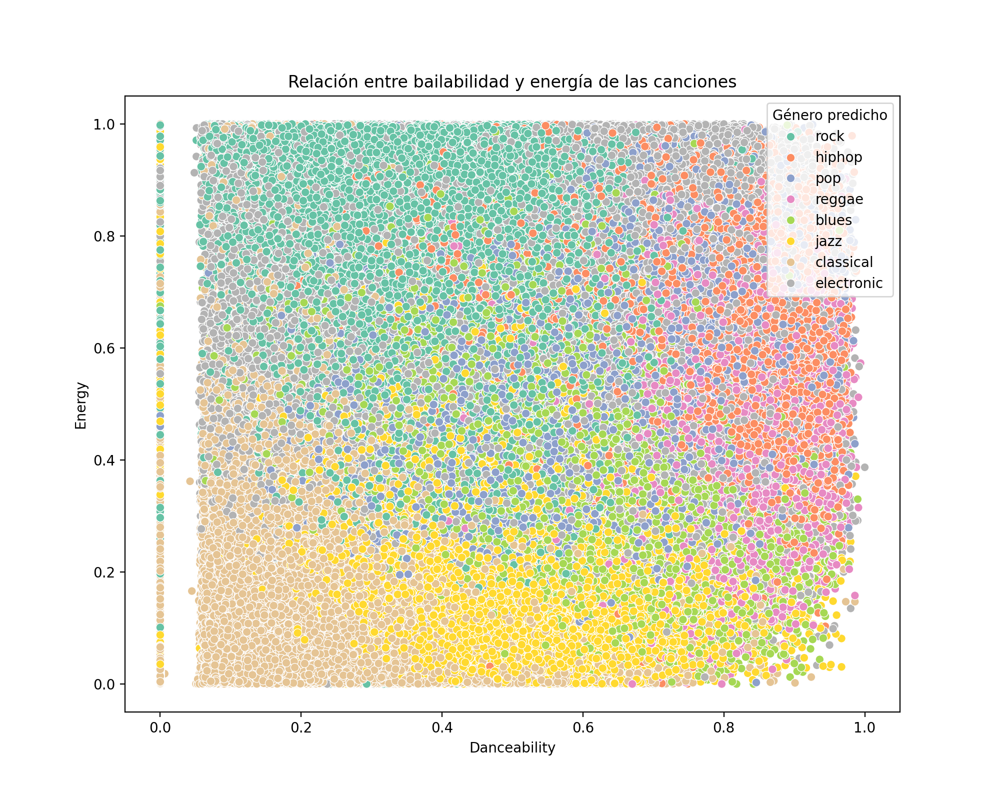

In [ ]:
# RELACION ENTRE BAILABILDAD Y ENERGIA DE LAS CANCIONES

# Invertimos las predicciones a las etiquetas originales
predicted_labels_original = le.inverse_transform(df_predictions_final["predicted_genre"])

# Creamos gráfico de dispersión
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_predictions_final, x="danceability", y="energy", hue=predicted_labels_original, palette="Set2")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.title("Relación entre bailabilidad y energía de las canciones")
plt.legend(title="Género predicho", loc="upper right")
plt.show();

La gráfica muestra la relación entre la bailabilidad y la energía de las canciones en diferentes géneros musicales. Los puntos de colores representan canciones individuales y están codificados por colores según el género musical predicho.

Se puede observar una distribución variada, indicando que hay una amplia gama de energía y bailabilidad dentro de cada género. Aunque no hay clusters definidos para los géneros específicos, se puede observar cierta agrupación basada en el color/género.

La densidad de los puntos varía a lo largo del gráfico; hay una concentración particularmente alta en el rango medio tanto para la energía como para la bailabilidad. Esto podría sugerir que muchas canciones tienden a tener niveles medios de energía y bailabilidad, independientemente del género.

Cabe destacar, como era de esperar, que las canciones con más energía y bailabilidad son las de música electrónica, seguidas del hip hop. En el lado opuesto se sitúan, géneros como el jazz y la música clásica, lógicamente.

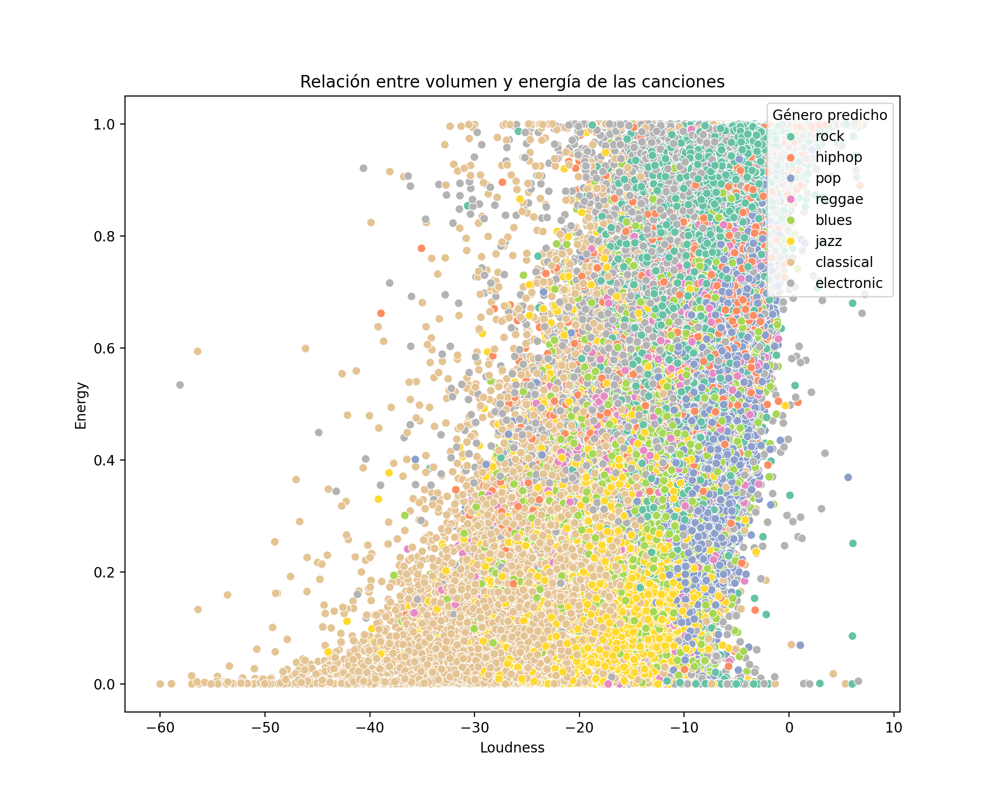

In [ ]:
# RELACION ENTRE VOLUMEN Y ENERGIA DE LAS CANCIONES

# Invertimos las predicciones a las etiquetas originales
predicted_labels_original = le.inverse_transform(df_predictions_final["predicted_genre"])

# Creamos gráfico de dispersión
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_predictions_final, x="loudness", y="energy", hue=predicted_labels_original, palette="Set2")
plt.xlabel("Loudness")
plt.ylabel("Energy")
plt.title("Relación entre volumen y energía de las canciones")
plt.legend(title="Género predicho", loc="upper right")
plt.show();

Existe una tendencia general donde a medida que aumenta el volumen, también lo hace la energía, aunque hay variaciones significativas dentro de cada género. Se observa que las canciones de rock y pop pueden tener un volumen y una energía más altos en comparación con los géneros como el jazz y la música clásica.

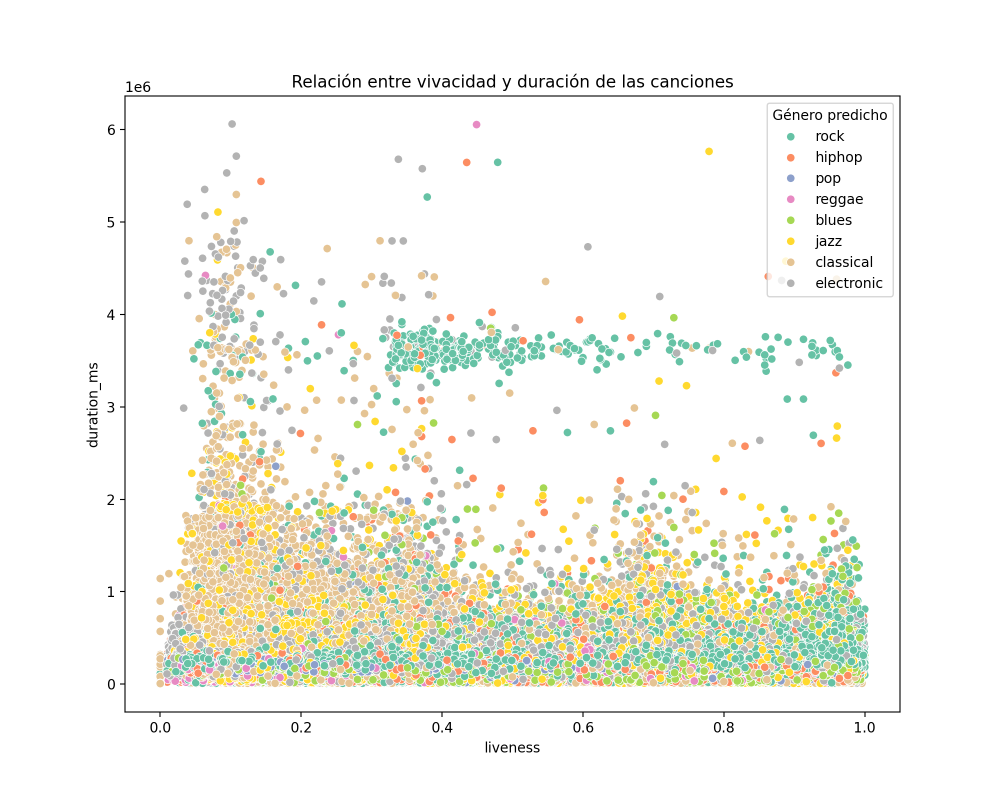

In [ ]:
# RELACION ENTRE VIVACIDAS Y DURACION DE LAS CANCIONES

# Invertimos las predicciones a las etiquetas originales
predicted_labels_original = le.inverse_transform(df_predictions_final["predicted_genre"])

# Creamos gráfico de dispersión
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_predictions_final, x="liveness", y="duration_ms", hue=predicted_labels_original, palette="Set2")
plt.xlabel("liveness")
plt.ylabel("duration_ms")
plt.title("Relación entre vivacidad y duración de las canciones")
plt.legend(title="Género predicho", loc="upper right")
plt.show();

 La mayoría de las canciones de este conjunto de datos de Spotify tienen una duración más corta, independientemente de su vivacidad.

Finalmente, crearemos un último dataframe ('df_final_genre_predictions') sólo con las columnas de nuestro interés:

Nombre de la canción, nombre del álbum, nombre del artista, año del disco y género predicho

In [ ]:
df_final_genre_predictions = df_predictions_final.drop(['danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature' ], axis=1)

df_final_genre_predictions

,name,album,artists,year,predicted_genre
0,Testify,The Battle Of Los Angeles,Rage Against The Machine,1999,7
1,Guerrilla Radio,The Battle Of Los Angeles,Rage Against The Machine,1999,7
2,Calm Like a Bomb,The Battle Of Los Angeles,Rage Against The Machine,1999,7
3,Mic Check,The Battle Of Los Angeles,Rage Against The Machine,1999,3
4,Sleep Now In the Fire,The Battle Of Los Angeles,Rage Against The Machine,1999,7
...,...,...,...,...,...
1140946,Hungry for Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,7
1140947,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,2
1140948,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,7
1140949,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,7


Sustituimos las etiquetas numéricas de género por sus nombre reales, y podemos dar ya por conseguido nuestro objetivo de clasificación de géneros musicales:

In [ ]:
#mapeo de géneros
genre_mapping = dict(zip(codigos_asignados, equivalentes_originales))

# reemplazamos los códigos en el DataFrame
df_final_genre_predictions['predicted_genre'] = df_final_genre_predictions['predicted_genre'].map(genre_mapping)

df_final_genre_predictions

,name,album,artists,year,predicted_genre
0,Testify,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
1,Guerrilla Radio,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
2,Calm Like a Bomb,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
3,Mic Check,The Battle Of Los Angeles,Rage Against The Machine,1999,hiphop
4,Sleep Now In the Fire,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
...,...,...,...,...,...
1140946,Hungry for Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,rock
1140947,All or Nothing - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,electronic
1140948,Spit It Out - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,rock
1140949,Guilty of Love - UK Mix; 2019 Remaster,Slide It In (The Ultimate Edition; 2019 Remaster),Whitesnake,2019,rock


Adicionalmente, podemos crear dataframes por cada uno de los 8 géneros musicales:

In [ ]:
df_pop = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'pop']

df_pop.head()

,name,album,artists,year,predicted_genre
23,Do It for Love,Do It for Love,Daryl Hall & John Oates,2018,pop
24,Someday We'll Know,Do It for Love,Daryl Hall & John Oates,2018,pop
25,Forever for You,Do It for Love,Daryl Hall & John Oates,2018,pop
27,Getaway Car,Do It for Love,Daryl Hall & John Oates,2018,pop
28,Make You Stay,Do It for Love,Daryl Hall & John Oates,2018,pop


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_pop_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'pop'].sample(n=10)
df_pop_sample

,name,album,artists,year,predicted_genre
1000015,Angels We Have Heard On High,Relaxing Christmas Music,Christina Aguilera,2019,pop
418790,Chanson pour hier et demain,Inoxydable,Marie-Mai,2004,pop
556986,Jesus Loves You (Jesus Hates Me),The Band Known As Sea Water Bliss,The Band Known As Sea Water Bliss,2006,pop
1023010,Game For Sale,Mr. Yessuh,Kenzo,2009,pop
812462,Masterpiece - (solo),Dandelion,Big Thief,2016,pop
1008594,Woah,Hightide,"Engelwood, Jeff Kaale",2016,pop
1069828,What Are You,What Are You,FlukeLuke,2017,pop
1003031,BGM,BGM,Wale,2019,pop
427042,Leevme Alone,The Best Of Mac Dre II,Mac Dre,2004,pop
371244,La maldicion de Malinche,Identidades,Maria Ines Ochoa,2002,pop


In [ ]:
df_classical= df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'classical']

df_classical.head()

,name,album,artists,year,predicted_genre
53,Train In The Rain,Dart To The Heart,Bruce Cockburn,1994,classical
408,Marvel,Martin Rev,Martin Rev,2002,classical
409,5 To 5,Martin Rev,Martin Rev,2002,classical
417,All Through The Night,Holiday Songs And Lullabies,Shawn Colvin,1998,classical
425,Close Your Eyes,Holiday Songs And Lullabies,Shawn Colvin,1998,classical


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_classical_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'classical'].sample(n=10)
df_classical_sample


,name,album,artists,year,predicted_genre
769776,"Romance for Violin & Piano in A Major, Op. 23","C. Schumann, Smyth & Beach: Works for Violin &...","Amy Beach, Tasmin Little, John Lenehan",2019,classical
121665,There Is A Road,The Sound Of Peace,John Fluker,2006,classical
697700,"6 Preludes & Fugues, Op. 35 (Arr. P. Haas for ...",Romantic Music for Harp,"Felix Mendelssohn, Pauline Haas",2017,classical
1100546,Memories of My Son - Requiem,Nagasaki: Memories Of My Son (Original Soundtr...,Ryuichi Sakamoto,2016,classical
907326,"Almighty God, who by thy Son","Gibbons, O.: Organ Music (Complete) / Anthems ...","Orlando Gibbons, Philip Scriven, ""Choir of St....",1994,classical
669066,"Gretchen am Spinnrade, D.118",Schubert,"Franz Schubert, Natalie Dessay",2017,classical
373705,"Keyboard Concerto in F Minor, BWV 1056: III. P...","Bach: Keyboard Concertos, Vol. 2","Johann Sebastian Bach, Murray Perahia, Academy...",2002,classical
1029115,"6 National Airs with Variations, Op. 105: No. ...",Beethoven: Variations on Folk Songs,"Ludwig van Beethoven, Patrick Gallois, Maria P...",2015,classical
233904,Trapeze Suite (arr. P. Lane): II. Romance,"Arnold, M.: Film Music, Vol. 2","Malcolm Arnold, Philip Lane, BBC Philharmonic,...",2000,classical
294511,Outro,Doomsday Kid. Diaries,P.I.Light,2010,classical


In [ ]:
rock_artists_df = df_final_genre_predictions.loc[df_final_genre_predictions['predicted_genre'] == 'rock']

rock_artists_df.head()

,name,album,artists,year,predicted_genre
0,Testify,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
1,Guerrilla Radio,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
2,Calm Like a Bomb,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
4,Sleep Now In the Fire,The Battle Of Los Angeles,Rage Against The Machine,1999,rock
5,Born of a Broken Man,The Battle Of Los Angeles,Rage Against The Machine,1999,rock


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_rock_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'rock'].sample(n=10)
df_rock_sample

,name,album,artists,year,predicted_genre
1054163,Nobody's Fool,Four The Record,Miranda Lambert,2011,rock
1124221,MMC (Mac) Band Praise,Declaration of Dependence,Mississippi Mass Choir,2014,rock
769314,Another You,Delivered,Firsthand,2005,rock
340845,Soiree - US Version,At The Close Of Every Day,Arid,2000,rock
1048993,Light a Candle for Me,Remembering the Basher (repackaged),Overdrive,2011,rock
3749,Hellraiser's Ball,Waking The Dead,L.A. Guns,2003,rock
502486,Livin',Throwin' Bones,"""Chubby Nothin and the Bone""",1998,rock
259453,Ash-Shahid,The Burial Tree (II),Ana Kefr,2011,rock
969544,Oh Ruby,80´s Arena Rock,Dirty Looks,2017,rock
1140437,I Heard it in the 80s - LAM Extended Mix,I Heard it in the 80s,LorD and Master,2019,rock


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_jazz = df_final_genre_predictions.loc[df_final_genre_predictions['predicted_genre'] == 'jazz']

df_jazz.head()


,name,album,artists,year,predicted_genre
50,Burden Of The Angel/Beast,Dart To The Heart,Bruce Cockburn,1994,jazz
55,Love Loves You Too,Dart To The Heart,Bruce Cockburn,1994,jazz
65,wampum prayer,Scarlet's Walk,Tori Amos,2002,jazz
66,don't make me come to Vegas,Scarlet's Walk,Tori Amos,2002,jazz
68,Your Cloud,Scarlet's Walk,Tori Amos,2002,jazz


In [ ]:
df_jazz_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'jazz'].sample(n=10)
df_jazz_sample

,name,album,artists,year,predicted_genre
754202,Boatwoman,Unless,Hawktail,2018,jazz
121200,For Always,Piano Passion,"Linda Gentille, Princess of the Piano",1997,jazz
306689,Lucia di Lammermoor: Orrida e questa notte (Ed...,Operatic Duets for Tenor and Baritone,"Gaetano Donizetti, Janez Lotric, Igor Morozov,...",1994,jazz
13417,Confessions,Better Today Then,Wow & Flutter,2001,jazz
683189,Leave Awe To Its Devices,Leave Home,John Davis,1997,jazz
1030715,"Cannily, Cannily",Joy of Living: A Tribute to Ewan MacColl,The Unthanks,2015,jazz
86954,High Water Everywhere Pt. 1,The Best Of Charlie Patton,Charley Patton,2005,jazz
227070,"""81""",Earthdance,"Jerry Gonzalez, The Fort Apache Band",1991,jazz
925870,Triptych: II. Scherzo: Allegro con spirito,British Women Composers,"Phyllis Tate, Clare Howick, Sophia Rahman",2010,jazz
547234,That's Hoss,Writ By Hand,Brian Gale,2000,jazz


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_electronic = df_final_genre_predictions.loc[df_final_genre_predictions['predicted_genre'] == 'electronic']

df_electronic.head()

,name,album,artists,year,predicted_genre
75,Virginia,Scarlet's Walk,Tori Amos,2002,electronic
102,Swing,Waste Of Mind,zebrahead,1998,electronic
107,Bootylicious Vinyl,Waste Of Mind,zebrahead,1998,electronic
110,To The Teeth (Shootout Remix),Swing Set,Ani DiFranco,2000,electronic
116,Wish I May,To The Teeth,Ani DiFranco,1999,electronic


In [ ]:
df_electronic_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'electronic'].sample(n=10)
df_electronic_sample

,name,album,artists,year,predicted_genre
34184,Empty Hands,Realize,Karsh Kale,2001,electronic
605768,Hooked Up,Classic Drum & Bass Cuts (1999 to 2009),NJC,2015,electronic
5088,Atlantis Part 2. - Sea of Antiquity,Planet X,"Derek Sherinian, Brett Garsed, Tony Franklin, ...",1999,electronic
1111980,Forever Endeavour - Tungorna Remix,Forever Endeavour,"Man Without Country, Tungorna",2020,electronic
443848,"Kill 'em, Fuck 'em, Eat 'em",Dystopia,Owl Vision,2013,electronic
780172,We Will All Go Funky - Luie's Dub,We Will All Go Funky,Funky Destination,2009,electronic
1099954,Darkest Little Friend,Darkest Little Friend,Heyz,2018,electronic
445045,Le vrai le faux,Le vrai le faux,Jérôme Minière,2010,electronic
68772,Blandished Hatman,Speak Squeak Creak,Melt-Banana,1994,electronic
61247,An Echo In,Glass,The Sea and Cake,2003,electronic


In [ ]:
df_blues = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'blues']

df_blues.head()

,name,album,artists,year,predicted_genre
46,Friday's Child,Fridays Child,Will Young,2003,blues
47,Listen For The Laugh,Dart To The Heart,Bruce Cockburn,1994,blues
48,All The Ways I Want You,Dart To The Heart,Bruce Cockburn,1994,blues
49,Bone In My Ear,Dart To The Heart,Bruce Cockburn,1994,blues
56,Sunrise On The Mississippi,Dart To The Heart,Bruce Cockburn,1994,blues


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_blues_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'blues'].sample(n=10)
df_blues_sample


,name,album,artists,year,predicted_genre
464978,Dande,Monoswezi Yanga,Monoswezi,2015,blues
446593,Have Mercy,We All Go Down Together,The Salty Suites,2014,blues
177858,Learn to Listen,Greatest Hits,Kids Techno,2001,blues
319896,In the Mood,The Best Of Tyrone Davis: In The Mood,Tyrone Davis,1976,blues
253260,Awaken The Sfinks,Alive In Europe,The Shuffle Demons,2008,blues
650489,When Are You Gone,Just A Satellite,Mark Aaron James,2006,blues
1016721,Words Cannot Describe,You Think It's Like This But Really It's Like ...,Mirah,2020,blues
551713,"Me, Myself and I",Duke Robillard And His Dames Of Rhythm,Duke Robillard Featuring Elizabeth McGovern,2017,blues
666958,Verdi: Il Trovatore: L'onda de' suoni mistici ...,Il trovatore,"Giuseppe Verdi, Gabriella Tucci, Carlo Bergonzi",1997,blues
881078,Follow Your Dreams,Other Side of the Gemini,"Monnette Sudler, Annette Hardeman, Cynthia Big...",2012,blues


In [ ]:
df_hiphop = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'hiphop']

df_hiphop.head()

,name,album,artists,year,predicted_genre
3,Mic Check,The Battle Of Los Angeles,Rage Against The Machine,1999,hiphop
13,Killing In the Name,Rage Against The Machine,Rage Against The Machine,1992,hiphop
14,Take the Power Back,Rage Against The Machine,Rage Against The Machine,1992,hiphop
108,Swing (Radio Edit),Swing Set,Ani DiFranco,2000,hiphop
109,Swing (Album Version),Swing Set,Ani DiFranco,2000,hiphop


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_hiphop_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'hiphop'].sample(n=10)

df_hiphop_sample

,name,album,artists,year,predicted_genre
465653,Sick and Heinous,Lifestyles of the Sick and Heinous,Sick for Brains,2013,hiphop
937828,Fuego,Game Over,"Le D, Nyda",2018,hiphop
382665,I Ain't Hating,The Legend,"DJ Screw, Ice-T",2001,hiphop
1018405,Sky is the Limit,Nur Noch Nice / Nur Noch So,Summer Cem,2019,hiphop
321747,Zone Money (Remix) [feat. Young Ralp & Young B...,Last Man Standing,Cj Platinum,2011,hiphop
773422,Victim Of The Clutch,Ghetto Dream$,Mo Drama,2000,hiphop
176600,Russian Roulette,Tyrone Wells,Tyrone Wells,2003,hiphop
964680,1984,1984,GASHI,2020,hiphop
199373,"Quote, Assist, Drunk, Vet, Cat",Jokes To Make My Parents Proud,Shane Mauss,2010,hiphop
472507,On It,Doing the Most,Kirby Maurier,2015,hiphop


In [ ]:
df_reggae = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'reggae']

df_reggae.head()

,name,album,artists,year,predicted_genre
31,Breath of Your Life,Do It for Love,Daryl Hall & John Oates,2018,reggae
37,Your Game,Fridays Child,Will Young,2003,reggae
38,Stronger,Fridays Child,Will Young,2003,reggae
42,Very Kind,Fridays Child,Will Young,2003,reggae
43,Free,Fridays Child,Will Young,2003,reggae


In [ ]:
# podemos hacer un sample y que nos liste canciones aleatoriamente.

df_reggae_sample = df_final_genre_predictions[df_final_genre_predictions['predicted_genre'] == 'reggae'].sample(n=10)
df_reggae_sample

,name,album,artists,year,predicted_genre
576282,Llorar|cumbia,Cumbia Total,Cumbia Latin Band,2008,reggae
575663,Patron San Sebastian,Sigue el Sabor. Música de Guatemala para los L...,Marimba Orquesta Sonora Ideal,2016,reggae
221432,Green Food,Underwater,Miss Amy,2004,reggae
664038,I Once Had Your Love (And I Can't Let Go),Love Songs,The Isley Brothers,2001,reggae
863298,Borders (feat. Lenny Kravitz),Ghetto Lenny's Love Songs,"SAINt JHN, Lenny Kravitz",2019,reggae
278071,We Got Love,Harvest Uptown,Soul Syndicate,2009,reggae
919210,It's Not the Best Choice!,The Outer Worlds (Original Soundtrack),Justin E. Bell,2019,reggae
1094924,Im Gone,Mi Name Gregory (Revenge),"Gregory Isaacs, Skycru, Frederica Tibbs",2018,reggae
950773,Смородина,"Той женщине, которая...",Kristina Orbakaitė,1999,reggae
1110814,Second Son,It Gets Deeper,"AJ Bank$Y, Gwai Mak",2018,reggae


Obtenemos un listado del total de clasificaciones realizadas por género musical:

In [ ]:
# Convertimos predicted_genres: array de NumPy a dataframe
predicted_genres_series = pd.Series(predicted_genres)

# conteo de predicciones para cada género
predictions_count = predicted_genres_series.map(genre_mapping).value_counts()

predictions_count

rock          245381
classical     196929
electronic    181582
jazz          147130
blues         143209
pop           107482
hiphop         74738
reggae         44500
dtype: int64

Graficamos el conteo:

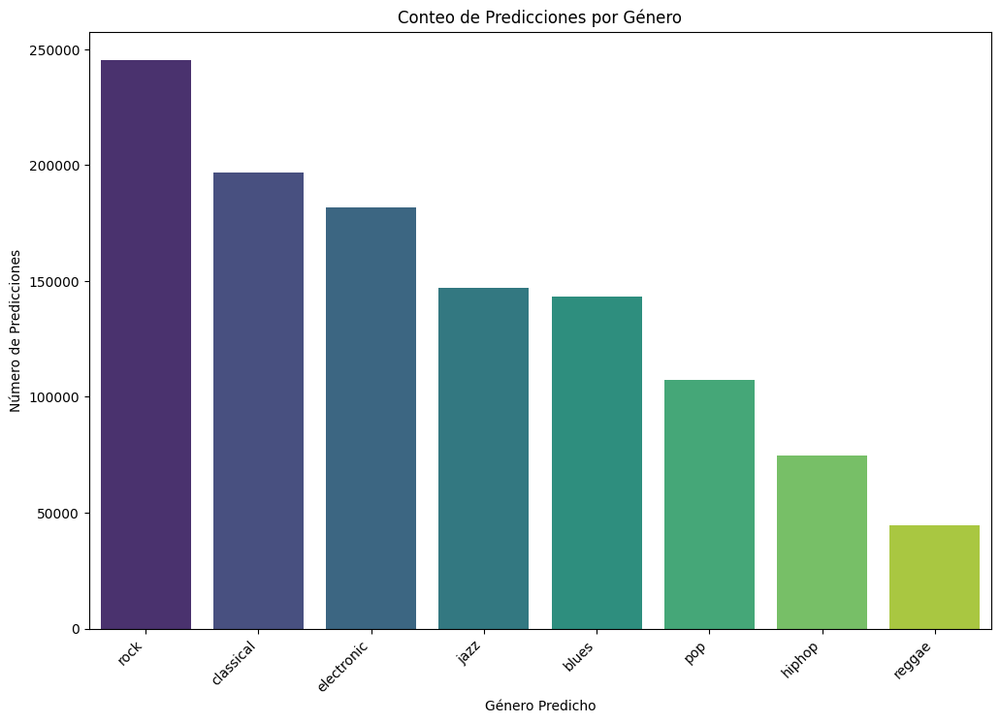

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(x=predictions_count.index, y=predictions_count.values, palette='viridis')
plt.title('Conteo de Predicciones por Género')
plt.xlabel('Género Predicho')
plt.ylabel('Número de Predicciones')
plt.xticks(rotation=45, ha='right')
plt.show()

**BUSCADORES DE CANCIONES Y ARTISTAS:**

Tras conseguir aplicar nuestro modelo de clasificación, podemos definir funciones bien para buscar una canción y obtener su género, o bien para buscar un grupo/artista y que nos diga también a qué género pertenece.

BUSCADOR POR CANCION: El código nos pide introducir el título de una canción, y nos devolverá, si existe en nuestra base de datos, lo siguiente:

Nombre del artista

Género

Título del álbum

Año de publicación

Si existen diversos artistas (o álbumes) para un mismo título de canción, obtendremos un listado de todos ellos.

In [ ]:
def obtener_info_cancion(dataframe, nombre_cancion):
    # Filtrar el DataFrame para encontrar exactamente la canción y obtener su información
    resultados = dataframe[dataframe['name'].str.lower() == nombre_cancion.lower()].drop_duplicates(subset=['name', 'artists', 'album', 'year'])

    # Verificar si se encontró información y mostrar el resultado
    if not resultados.empty:
        for index, row in resultados.iterrows():
            genero = row['predicted_genre']
            artista = row['artists']
            cancion = row['name']
            album = row['album']
            año = row['year']

            print(f"Información para la canción '{cancion}':")
            print(f"  Artista: {artista}")
            print(f"  Género: {genero}")
            print(f"  Álbum: {album}")
            print(f"  Año: {año}")
    else:
        print(f"No se encontró información para la canción '{nombre_cancion}'.")

# Ejemplo de uso
nombre_cancion = input("Introduce el nombre de la canción: ")
obtener_info_cancion(df_final_genre_predictions, nombre_cancion)


BUSCADOR POR ARTISTA/BANDA: El código nos pide introducir el nombre de un artista, y nos devolverá, si existe en nuestra base de datos, lo siguiente:

Título de todas las canciones que haya en nuestro dataset el artista en concreto

Género de las canciones

Título del álbum o álbumes del artista que existan en el dataset

Año de publicación de las canciones/álbumes

In [ ]:
def obtener_info_artista(dataframe, nombre_artista):
    # Filtrar el DataFrame para encontrar todas las canciones del artista y obtener su información
    resultados = dataframe[dataframe['artists'].str.lower() == nombre_artista.lower()].drop_duplicates(subset=['name', 'artists', 'album', 'year'])

    # Verificar si se encontró información y mostrar el resultado
    if not resultados.empty:
        print(f"Información para el artista '{nombre_artista}':")
        for index, row in resultados.iterrows():
            genero = row['predicted_genre']
            artista = row['artists']
            cancion = row['name']
            album = row['album']
            año = row['year']

            print(f"  Canción: {cancion}")
            print(f"    Género: {genero}")
            print(f"    Álbum: {album}")
            print(f"    Año: {año}")
    else:
        print(f"No se encontró información para el artista '{nombre_artista}'.")

# Ejemplo de uso
nombre_artista = input("Introduce el nombre del artista: ")
obtener_info_artista(df_final_genre_predictions, nombre_artista)


Podemos concluir que el modelo demuestra una capacidad prometedora. Con futuros ajustes, se espera mejorar aún más la precisión en la clasificación.

Los principales "problemas" en la categorización han sido los siguientes:

Delgada Línea entre Géneros:
Reconocer la delgada línea que separa a un género de otro y la dificultad inherente en la clasificación, considerando la variabilidad y fusiones que existen en la música.

Posible categorización de géneros errónea por parte de Spotify:
Es bastante factible que no todos los géneros estén correctamente definidos por Spotify, pudiendo nuestro modelo clasificar géneros distintos aún teniendo métricas similares.

Aspectos a mejorar:
Explorar la posibilidad de ampliar el abanico de géneros y subgéneros musicales para lograr un modelo más robusto y representativo de la diversidad musical. Por ejemplo, para este estudio, hemos obviado géneros tan importantes como podrían ser, entre otros, el soul, r&b, country, disco, metal, indie, folk, etc

Refinar y optimizar la selección de características y parámetros del modelo.